# Exploration of the UK Gender Pay Gap and Sector-based Classification

## Table of Contents

- Introduction
- Data
- Pre-processing
- Modelling - Classification
- Discussion
- References
- Libraries


## Introduction
Paying women less than men is unfair and has far-reaching implications for society by contributing to the gender pay gap (GPG), women’s lower pension contributions and their higher incidence of relative poverty in later life (Whaley, 2018). The UK’s national Gender Pay Gap (GPG; 17.9%*; Equal Pay Portal, 2018) is currently higher than both the OECD and EU average (OECD=13.5%, EU=16.2%; OECD Social Policy Division, 2018). 

GPG is the difference in average hourly wage of all men and women across a workforce and refers to the uneven distribution of men and women in high/low income positions/hourly wage across a company (GOV.UK, 2018a). Whereas, unequal pay (which has been illegal since 1970; Equal Pay Act, 1970) is paying men and women differently for performing the same (or similar) work. 

In 2017, the UK launched regulation legally requiring all employers with more than 250 employees to report and publish their GPG data yearly (GOV.UK, 2018b). Making this data public is an important step towards understanding and closing the GPG.

Especially, financial services companies have been subject to public scrutiny after reporting their GPG (Gordon et al., 2018). E.g. Goldman Sachs International reported a 36.4% median GPG in 2017 (GOV.UK, 2017). Having this data public adds accountability to companies and puts pressure on them to close the GPG. 

By requiring companies to report GPG data yearly, they are encouraged to monitor and evaluate their action plans and set specific time-bound targets. An example of a company taking action to decrease their GPG after publishing their numbers is EasyJet. In the first reporting in 2017 their hourly median GPG was 45.5%. However, they addressed this imbalance by launching an initiative (i.e. the Amy Johnson Initiative; EasyJet, 2018) targeting that 20% of new cadet pilots should be female by 2020. In 2018, 13% of their pilots were women. Although, their 2018 median GPG was 47.9%, this is due to a large intake of women in the lower quartile pay bracket, who will over time rise to higher paying positions. This highlights the importance of interpreting results with caution and within context. 

The GPG data can be used to identify trends and issues within companies and sectors. Looking at statistics at sector level can help target efforts effectively. Behaviour change interventions aimed at decreasing the GPG rely on an understanding of the target group to be the most effective (i.e. no one size fits all model) (Ajzen, 2002). Target groups vary in the behaviour/culture at the root of the ‘problem’ (e.g. GPG). Therefore, it makes sense to identify groups with similar characteristics and aim interventions at this level. It is reasonable to argue that sectors/divisions largely share a culture/behaviour associated with the line of behaviour. Therefore, the Standard Industrial Classification (SIC) system used in the UK to divide companies by sectors is especially helpful in identifying which sectors need intervention and understand how to orchestrate it. 

The SIC code system is used to classify industries by a five-digit code and is used by government agencies (e.g. Companies House, ONS) to systematically identify and categorise the principal business activities of companies within the UK (ONS, 2007). The SIC codes can be grouped into progressively broader industry classifications: industry group, major group, and division (i.e. the first 2 digits indicate the major group). 

This paper will look at the reported GPG data from 2017 and 2018 and explore whether the reported GPG data can classify which sector a company belongs to. The following multilabel classification models are tested to assess which perform the best for this task: Random Forest, Knn, Naïve Bayes and Decision tree. Based on this assessment, this paper will conclude that it is not possible to reliably classify which sector a company belongs to based on its reported GPG data.

• April 2018 – Median hourly difference among all employees (both full-time and part-time)

## Data
The data used in this paper is the official UK GPG reports from the years spanning 2017-18 and 2018-19 which are publicly available online as CSV files (GOV.UK, 2019). Transparency is key, and this dataset is collected in the same way across all companies which allows for comparability. 

The data includes the following variables: mean hourly GPG, median hourly GPG, mean bonus GPG, median bonus GPG, proportion of men in the organisation receiving a bonus payment, proportion of women in the organisation receiving a bonus payment, and the proportion of men and women in each quartile pay band. 
Mean hourly GPG calculations are made by 1) adding together the hourly pay rates of all male full-time employees, 2) dividing this figure by the number of male full-time employees - this gives you the hourly pay rate for men, 3) do the same for all female full-time employees to get the hourly pay rate for women, 4) subtract the mean hourly pay rate for women from the mean hourly pay rate for men, 5) divide the result by the mean hourly pay rate for men, 6) multiply the result by 100 - this gives you the mean gender pay gap in hourly pay as percentage of men's pay (Government Equalities Office, 2017). Similar steps are taken to calculate all other measures (i.e. all numbers reflect a percentage of men's pay - if the GPG is 22% it means that women on average earn 22% less than men).

Remuneration provided otherwise than in money (e.g. vouchers) are excluded from the ordinary pay measures but are included in 'bonus pay'. Yet salary sacrifice vouchers (e.g. childcare) is not included in bonus pay but is calculated into the ordinary pay.

## Preprocessing
The first step is preprocessing which consists of loading, cleaning, and coding the data. This is an important step to familiarise oneself with the data. Similarly, this is where the data is cleaned so it is compatible with the classifications further on in this paper.

#### Data loading and initial familiarisation
Firstly, the 2017 and 2018 GPG data was loaded into the notebook and saved as data frames (DFs), using the ‘Pandas’ library. Additionally, initial data familiarisation was conducted assessing the variables, sample size of the two data frames, and missing values. 

In [1]:
import pandas as pd

pd.set_option('display.max_rows', 300) # specifies number of rows to show
pd.options.display.float_format = '{:40,.2f}'.format # specifies default number format to 4 decimal places

In [2]:
gender_data_path18 = '/Users/dagmar/Desktop/UCL/DSSS-0006/Final Assignment/Gender pay gap/GPG_18_19.csv'
gender_data_path17 = '/Users/dagmar/Desktop/UCL/DSSS-0006/Final Assignment/Gender pay gap/GPG_17_18.csv'
# read the data and store data in DataFrame
gender_data18 = pd.read_csv(gender_data_path18, encoding='utf-8') 
gender_data17 = pd.read_csv(gender_data_path17, encoding='utf-8') 

In [3]:
gender_data17.count() # get overview of variables and sample size

EmployerName                 10550
Address                      10550
CompanyNumber                 9195
SicCodes                      9981
DiffMeanHourlyPercent        10550
DiffMedianHourlyPercent      10550
DiffMeanBonusPercent         10541
DiffMedianBonusPercent       10541
MaleBonusPercent             10550
FemaleBonusPercent           10550
MaleLowerQuartile            10550
FemaleLowerQuartile          10550
MaleLowerMiddleQuartile      10550
FemaleLowerMiddleQuartile    10550
MaleUpperMiddleQuartile      10550
FemaleUpperMiddleQuartile    10550
MaleTopQuartile              10550
FemaleTopQuartile            10550
CompanyLinkToGPGInfo          7791
ResponsiblePerson             8872
EmployerSize                 10550
CurrentName                  10550
SubmittedAfterTheDeadline    10550
DueDate                      10550
DateSubmitted                10550
dtype: int64

In [4]:
gender_data18.count()

EmployerName                 6664
Address                      6664
CompanyNumber                5445
SicCodes                     6362
DiffMeanHourlyPercent        6664
DiffMedianHourlyPercent      6664
DiffMeanBonusPercent         5617
DiffMedianBonusPercent       5617
MaleBonusPercent             6664
FemaleBonusPercent           6664
MaleLowerQuartile            6664
FemaleLowerQuartile          6664
MaleLowerMiddleQuartile      6664
FemaleLowerMiddleQuartile    6664
MaleUpperMiddleQuartile      6664
FemaleUpperMiddleQuartile    6664
MaleTopQuartile              6664
FemaleTopQuartile            6664
CompanyLinkToGPGInfo         4566
ResponsiblePerson            5056
EmployerSize                 6664
CurrentName                  6664
SubmittedAfterTheDeadline    6664
DueDate                      6664
DateSubmitted                6664
dtype: int64

Based on the initial assessment, the 2017 data contains 10,550 records (i.e. companies). Whereas, the 2018 data contains 6,664 records. This means that 3,886 fewer companies (a 37% reduction) recorded their GPG in 2018 than in 2017. Either the number of companies with 250 or more employees fell dramatically between 2017 and 2018, or not all companies fulfill their legal requirement to report their GPG data.

Additionally, it seems that not all companies have reported their SIC codes, as both the number of records for this variable is lower than the total sample size for both 2017 and 2018 indicating missing values. The variables for Company number, Company link, and responsible person also contains missing values, however this is not an issue as they are not relevant to this analysis. 

#### Data validation

In [5]:
gender_data17.describe()

,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile
count,"10,550.00","10,550.00","10,541.00","10,541.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00","10,550.00"
mean,14.34,11.80,7.68,-21.75,35.38,33.93,46.34,53.66,50.53,49.47,54.87,45.13,60.81,39.19
std,14.91,15.84,833.69,"1,400.10",36.32,36.02,24.14,24.14,26.09,26.09,26.22,26.22,24.41,24.41
min,-400.00,-196.50,"-82,000.00","-120,695.00",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,5.00,0.70,0.00,0.00,0.80,0.30,27.00,35.60,29.50,27.60,34.00,21.50,41.50,17.10
50%,13.30,9.30,22.00,5.00,19.30,17.20,44.40,55.60,48.30,51.70,54.00,46.00,62.70,37.30
75%,22.90,21.00,53.00,38.00,73.07,70.10,64.40,73.00,72.40,70.50,78.50,66.00,82.90,58.50
max,159.00,121.20,"3,848.20","3,848.20",100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00


In [6]:
gender_data18.describe()

,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile
count,"6,664.00","6,664.00","5,617.00","5,617.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00","6,664.00"
mean,13.98,12.13,16.37,0.61,33.02,31.87,44.06,55.94,47.93,52.07,52.00,48.00,57.96,42.04
std,13.64,15.51,207.46,247.45,36.82,36.51,23.95,23.95,26.03,26.03,26.11,26.11,24.32,24.32
min,-65.00,-92.30,"-13,934.00","-13,934.00",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,5.00,1.00,0.00,0.00,0.00,0.00,25.00,38.68,27.00,31.00,31.00,25.00,38.50,20.67
50%,13.00,10.00,26.50,10.00,12.60,11.30,41.30,58.70,44.55,55.45,49.10,50.90,58.00,42.00
75%,22.00,21.10,53.90,39.70,72.50,69.10,61.32,75.00,69.00,73.00,75.00,69.00,79.32,61.50
max,91.70,79.30,134.20,"4,000.00",100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00


Looking at the mean and standard deviation (SD) for each column (variable), the SD is larger than the mean across all columns except those describing males/females in each pay band quartile. This indicates a broad spread around the mean, which could indicate that these GPG indicators differ a lot from company to company (or across sectors). It is worth noting that both the mean and median GPG for both years favour men (i.e. overall men are paid just above 10% more than women).

In the 2017 DF, the maximum values for mean and median hourly percent difference exceed 100%. This is implausible as it indicates that women are paying their employer to work there. Therefore, the maximum positive value for the mean and median GPG should be less than 100%. 

Similarly, if a company reports a positive median GPG then logically the sum of the percentage of men in the top and upper-middle pay quartiles should be greater than the sum of the male percentages in the two lower quartiles.
Therefore, the DFs are checked to reveal any inconsistencies with the companies’ reports. To do this, the male quartile gap is calculated (i.e. percentage in top + upper-middle– percentage in lower and lower-middle income quartiles). If the median GPG is positive, the male quartile gap must also be positive, and any violation indicates an error. 

In [7]:
# create new df with male quartile gap calculation
maleQuartileGap17 = pd.DataFrame(gender_data17['MaleTopQuartile'] + gender_data17['MaleUpperMiddleQuartile'] - gender_data17['MaleLowerQuartile'] + gender_data17['MaleLowerMiddleQuartile'])
maleQuartileGap18 = pd.DataFrame(gender_data18['MaleTopQuartile'] + gender_data18['MaleUpperMiddleQuartile'] - gender_data18['MaleLowerQuartile'] + gender_data18['MaleLowerMiddleQuartile'])
# add the median GPG to the df for comparison
maleQuartileGap17['median'] = gender_data17['DiffMedianHourlyPercent']
maleQuartileGap18['median'] = gender_data18['DiffMedianHourlyPercent']
# rename columns
maleQuartileGap17.columns = ['MQG', 'median']
maleQuartileGap18.columns = ['MQG', 'median']

In [8]:
error_count17 = 0 # list to count errors
error_count18 = 0

for i,j in zip(maleQuartileGap17['MQG'],maleQuartileGap17['median']): # loop through df
    if (i <= 0 and  j >= 0) or (i >= 0 and j <= 0): # if one value is pos and other is neg
        error_count17 +=1 # then count as error

for i,j in zip(maleQuartileGap18['MQG'],maleQuartileGap18['median']):
    if (i <= 0 and  j >= 0) or (i >= 0 and j <= 0):
        error_count18 +=1

print('Errors in 2017:', error_count17)
print('Errors in 2018:', error_count18)

Errors in 2017: 2404
Errors in 2018: 1448


Checking the data for ‘quartile-median’ inconsistencies reveals that there were 2,404 errors in 2017 (23%), and 1,448 in 2018 (22%). Although, the absolute number of errors has decreased, the percentage remains the same. It is unclear whether these errors are committed unknowingly by companies because the format for collecting and reporting data is too complicated, or if they try to cover up their numbers. However, it is clear that the government does not audit the reported data, which renders the exercise/legislation somewhat pointless. 

Finally, a check is made to assess whether companies report both mean and median GPG as 0%. Although, such a finding does not directly constitute an error, it is statistically implausible as the two statistics measure different things. Similarly, it is unlikely that many companies have exactly 0% GPG (neither mean nor median). Consequently, such findings would suggest that companies report inaccurate data.

In [9]:
zero_count17 = 0
zero_count18 = 0

for i,j in zip(gender_data17['DiffMeanHourlyPercent'],gender_data17['DiffMedianHourlyPercent']):
    if (i == 0 and  j == 0):
        zero_count17 +=1

for i,j in zip(gender_data18['DiffMeanHourlyPercent'],gender_data18['DiffMedianHourlyPercent']):
    if (i == 0 and  j == 0):
        zero_count18 +=1
        
print('Companies reporting both Median & Mean GPG as 0 (2017):', zero_count17)
print('Companies reporting both Median & Mean GPG as 0 (2018):', zero_count18)

Companies reporting both Median & Mean GPG as 0 (2017): 56
Companies reporting both Median & Mean GPG as 0 (2018): 40


In 2017, 56 companies (1%) reported both their median and mean GPG as 0%, and in 2018 40 companies (1%) did the same. Although, these numbers appear low relative to the total number of companies reporting GPG, the absolute numbers suggest that some companies report inaccurate data – possibly to hide their actual GPG from public scrutiny.

#### Data cleaning
The data validation revealed a substantial amount of inconsistencies and statistical implausibility. However, the data is an accurate representation of what companies report as their GPG data. As this paper aims to classify which sector a company belongs to based on their reported GPG data – and not necessarily the accuracy of said data – the reported inconsistencies are not removed from the dataset. Contrarily, these inconsistencies may in fact help classify companies.

The two data sets are merged together based on Company Number (i.e. the unique company id number). To avoid the merger returning the multiplication of the row dimensions, the 'CompanyNumber' column is first controlled for duplicate values. Similarly, all rows with missing values are removed from the datasets to facilitate the merger. However, first all variables which will not be used in the classification models are removed (i.e. Employer name, address, Company link, Responsible person, Current name, Due date, and Data submitted) to avoid these columns exerting undue influence when removing rows with missing values.

In [10]:
# drop irrelevant variables
data17 = gender_data17.drop(columns=['EmployerName', 'Address', 'CompanyLinkToGPGInfo', 'ResponsiblePerson', 'CurrentName', 'DueDate', 'DateSubmitted'])
data18 = gender_data18.drop(columns=['EmployerName', 'Address', 'CompanyLinkToGPGInfo', 'ResponsiblePerson', 'CurrentName', 'DueDate', 'DateSubmitted'])
print('Original number of rows in CompanyNumber column (2017):', data17['CompanyNumber'].count())
print('Original number of rows in CompanyNumber column (2018):', data18['CompanyNumber'].count())

Original number of rows in CompanyNumber column (2017): 9195
Original number of rows in CompanyNumber column (2018): 5445


In [11]:
# drop rows with missing values
dna_data17 = data17.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True) #drops rows with Na, but does not reset index values
dna_data17 = data17.reset_index(drop=True)  # resets index values

dna_data18 = data18.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True)
dna_data18 = data18.reset_index(drop=True)  

print('Rows without missing values (2017):', dna_data17['CompanyNumber'].count())
print('Rows without missing values (2018):', dna_data18['CompanyNumber'].count())

Rows without missing values (2017): 8649
Rows without missing values (2018): 4465


In [12]:
# check all missing values are removed
print('Missing values (2017):', dna_data17['MaleTopQuartile'][gender_data17['SicCodes']==""].count()) #double checks there are no missing values
print('Missing values (2018):', dna_data18['MaleTopQuartile'][gender_data18['SicCodes']==""].count())

Missing values (2017): 0
Missing values (2018): 0


Consequently, the 2017 data set is reduced to 8,649 records (18% reduction) and the 2018 data is reduced to 4,465 records (33% reduction). 

In [13]:
# checking and dropping duplicate values in CompanyNumber column
data2017 = dna_data17.drop_duplicates(['CompanyNumber'], keep='last')
data2018 = dna_data18.drop_duplicates(['CompanyNumber'], keep='last')

print('Duplicate Company Numbers (2017):', dna_data17['CompanyNumber'].count() - data2017['CompanyNumber'].count())
print('Duplicate Company Numbers (2018):', dna_data18['CompanyNumber'].count() - data2018['CompanyNumber'].count())

Duplicate Company Numbers (2017): 0
Duplicate Company Numbers (2018): 0


In [14]:
# merge datasets on company number with inner join (produces only the set of records that match in both Table A and Table B.)
Merged = pd.merge(data17, data18, on=['CompanyNumber'], how='inner')
print('The shape of the merged dataframe is:', Merged.shape)
# Merged.head() # x=2017, y=2018

The shape of the merged dataframe is: (4106, 35)


After merging the datasets, there are 4,106 rows left that match on Company Number (a 9% reduction from the possible 4465 rows left in the 2018 dataset after removing missing values and duplicates). 

#### Preparing data for classification models
The SIC codes represent the y variable (label/prediction) in the upcoming classification models. Therefore, rows with missing or ambiguous SIC code values are an issue when training the model. The first two digits in the SIC codes represent the major sector/industry group. Therefore, the first two digits are extracted and converted into a number from 1 to 12 to represent the major groups (sector). However, firstly all ambiguous SIC codes are reclassified as 'nonClassifiable' (e.g. digits below 2 digits, codes containing strings etc.).

In [15]:
nonClasIndex1_17 = [i for i in Merged.index if len(Merged['SicCodes_x'].loc[i])<2] #tells me the index value of all rows with values below 2 digits - these are nonclassifiable because the major groups are determined based on the first 2 digits
nonClasIndex2_17 = [i for i in Merged.index if len(Merged['SicCodes_x'].loc[i])>5] #tells me the index value of all rows that have ambiguous sic code information
nonClasIndex_17 = list(set(nonClasIndex1_17 + nonClasIndex2_17)) # merges the two nonclassifiable index lists and ensures no duplicates

nonClasIndex1_18 = [i for i in Merged.index if len(Merged['SicCodes_y'].loc[i])<2]
nonClasIndex2_18 = [i for i in Merged.index if len(Merged['SicCodes_y'].loc[i])>5] 
nonClasIndex_18 = list(set(nonClasIndex1_18 + nonClasIndex2_18))

In [16]:
#reclassifying to nonclassifiable SIC code category because of ambigious codes etc.
Merged['SicCodes_x'].loc[nonClasIndex_17]='9999' 
Merged['SicCodes_y'].loc[nonClasIndex_18]='9999' 

/Users/dagmar/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


Additionally, the SIC codes are cleaned to ensure all codes contain only numbers (i.e. no strings or characters) using the below regular expression.

In [17]:
# The \d represents any digit, and {4} repeats this rule four times. The ^ character matches the start of a string, and the parentheses denote a capturing group, which signals to Pandas that we want to extract that part of the regex. (We want ^ to avoid cases where [ starts off the string.)
Merged['SicCodes_x']=Merged['SicCodes_x'].str.extract(r'^(\d{4})', expand=False) # ensures all SIC codes are no more than 5 integers, long and has no string 'values'
Merged['SicCodes_y']=Merged['SicCodes_y'].str.extract(r'^(\d{4})', expand=False) # ensures all SIC codes are no more than 5 integers, long and has no string 'values'

The SIC code columns are converted from ‘object’ datatypes into integers in order to be converted into Major Industry Groups (sectors). This is an important step in preparing the data for the classification models, as this will reduce the SIC codes to 12 prediction groups/labels rather than the more than 500 current individual codes. Consequently, the SIC codes are converted into a number ranging from 1-12 based on the sector they belong to (Companies House, 2019): 

Range of SIC Codes Division / Sectors
- 01-09 Agriculture, Forestry and Fishing (AF&F) -> (1)
- 10-14 Mining -> (2)
- 15-17 Construction -> (3)
- 18-19 not used -> (4)
- 20-39 Manufacturing  -> (5)
- 40-49 Transportation, Communications, Electric, Gas and Sanitary service (TCEG&S) -> (6)
- 50-51 Wholesale Trade (WT)-> (7)
- 52-59 Retail Trade (RT) -> (8)
- 60-69 Finance, Insurance and Real Estate (FI&RE) -> (9)
- 70-89 Services -> (10)
- 91-97 Public Administration (PA) -> (11)
- 99-99 Nonclassifiable -> (12)

In [18]:
print('SIC code data type (2017):', Merged['SicCodes_y'].dtype)
print('SIC code data type (2018):', Merged['SicCodes_x'].dtype)

SIC code data type (2017): object
SIC code data type (2018): object


In [19]:
# converting object to integer. 
Merged['SicCodes_x'] = pd.to_numeric(Merged['SicCodes_x']) 
Merged['SicCodes_y'] = pd.to_numeric(Merged['SicCodes_y']) 
print('SIC code data type (2017):', Merged['SicCodes_y'].dtype)
print('SIC code data type (2018):', Merged['SicCodes_x'].dtype)

SIC code data type (2017): int64
SIC code data type (2018): int64


In [20]:
#converting SIC codes into only their first 2 digits (i.e. main division codes)
FirstTwoDigits17 = []
import re
for item in Merged['SicCodes_x']:
    temp = re.findall('[0-9]',str(item))
    temp = temp[0:2]
    temp = ''.join(temp)
    FirstTwoDigits17.append(temp)

FirstTwoDigits18 = []
import re
for item in Merged['SicCodes_y']:
    temp = re.findall('[0-9]',str(item))
    temp = temp[0:2]
    temp = ''.join(temp)
    FirstTwoDigits18.append(temp)

Merged['SicCodes_x']=FirstTwoDigits17
Merged['SicCodes_y']=FirstTwoDigits18

In [21]:
Merged['SicCodes_x'] = pd.to_numeric(Merged['SicCodes_x'])
Merged['SicCodes_y'] = pd.to_numeric(Merged['SicCodes_y'])

In [22]:
# recode SIC codes into Major Groups (1-12)
tempDiv17 = []
for i in Merged['SicCodes_x']:
    if i >= 1 and i <= 9:
        tempDiv17.append(1)
    if i >= 10 and i <= 14:
        tempDiv17.append(2)
    if i >= 15 and i <= 17:
        tempDiv17.append(3)
    if i >= 18 and i <= 19:
        tempDiv17.append(4)
    if i >= 20 and i <= 39:
        tempDiv17.append(5)
    if i >= 40 and i <= 49:
        tempDiv17.append(6)
    if i >= 50 and i <= 51:
        tempDiv17.append(7)
    if i >= 52 and i <= 59:
        tempDiv17.append(8)
    if i >= 60 and i <= 69:
        tempDiv17.append(9)
    if i >= 70 and i <= 89:
        tempDiv17.append(10)
    if i >= 90 and i <= 98:
        tempDiv17.append(11)
    if i == 99:
        tempDiv17.append(12)

tempDiv18 = []
for i in Merged['SicCodes_y']:
    if i >= 1 and i <= 9:
        tempDiv18.append(1)
    if i >= 10 and i <= 14:
        tempDiv18.append(2)
    if i >= 15 and i <= 17:
        tempDiv18.append(3)
    if i >= 18 and i <= 19:
        tempDiv18.append(4)
    if i >= 20 and i <= 39:
        tempDiv18.append(5)
    if i >= 40 and i <= 49:
        tempDiv18.append(6)
    if i >= 50 and i <= 51:
        tempDiv18.append(7)
    if i >= 52 and i <= 59:
        tempDiv18.append(8)
    if i >= 60 and i <= 69:
        tempDiv18.append(9)
    if i >= 70 and i <= 89:
        tempDiv18.append(10)
    if i >= 90 and i <= 98:
        tempDiv18.append(11)
    if i == 99:
        tempDiv18.append(12)

In [23]:
# replace the SIC code colummn with 
Merged['SicCodes_x']=tempDiv17
Merged['SicCodes_y']=tempDiv18

In [24]:
# check SIC codes x and y columns are the same! perhaps after the steps are done on each column!
diffSIC = 0

for i,j in zip(Merged['SicCodes_x'],Merged['SicCodes_y']):
    if (i != j):
        diffSIC +=1
print('Number of rows with different SIC codes:', diffSIC)

Number of rows with different SIC codes: 46


After recoding the two SIC code columns, 46 rows do not have matching SIC codes. Consequently, these rows are recoded as ‘nonclassifiable’ (i.e. 12). This means the 2017 and 2018 SIC codes now match, and one can be dropped as they are identical.

In [25]:
# get index for all non matching sic codes between the 2017 and 2018 sic code columns
sic = [i for i in Merged.index if Merged['SicCodes_x'].loc[i] != Merged['SicCodes_y'].loc[i]]

# reclassifying to nonclassifiable SIC code category
Merged['SicCodes_x'].loc[sic]='12' 
Merged['SicCodes_y'].loc[sic]='12' 

/Users/dagmar/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [26]:
Merged['SicCodes_x'] = pd.to_numeric(Merged['SicCodes_x'])
Merged['SicCodes_y'] = pd.to_numeric(Merged['SicCodes_y'])
# Drop one SIC code column
Merged = Merged.drop(columns=['SicCodes_y'])
# rename remaining sic code column
Merged.rename(columns={'SicCodes_x': 'SicCodes'}, inplace=True)

In [27]:
Merged.groupby(['SicCodes']).agg('count')

,CompanyNumber,DiffMeanHourlyPercent_x,DiffMedianHourlyPercent_x,DiffMeanBonusPercent_x,DiffMedianBonusPercent_x,MaleBonusPercent_x,FemaleBonusPercent_x,MaleLowerQuartile_x,FemaleLowerQuartile_x,MaleLowerMiddleQuartile_x,...,MaleLowerQuartile_y,FemaleLowerQuartile_y,MaleLowerMiddleQuartile_y,FemaleLowerMiddleQuartile_y,MaleUpperMiddleQuartile_y,FemaleUpperMiddleQuartile_y,MaleTopQuartile_y,FemaleTopQuartile_y,EmployerSize_y,SubmittedAfterTheDeadline_y
SicCodes,,,,,,,,,,,,,,,,,,,,,
2,112,112,112,112,112,112,112,112,112,112,...,112,112,112,112,112,112,112,112,112,112
3,31,31,31,31,31,31,31,31,31,31,...,31,31,31,31,31,31,31,31,31,31
4,14,14,14,14,14,14,14,14,14,14,...,14,14,14,14,14,14,14,14,14,14
5,421,421,421,421,421,421,421,421,421,421,...,421,421,421,421,421,421,421,421,421,421
6,509,509,509,509,509,509,509,509,509,509,...,509,509,509,509,509,509,509,509,509,509
7,17,17,17,17,17,17,17,17,17,17,...,17,17,17,17,17,17,17,17,17,17
8,291,291,291,291,291,291,291,291,291,291,...,291,291,291,291,291,291,291,291,291,291
9,344,344,344,344,344,344,344,344,344,344,...,344,344,344,344,344,344,344,344,344,344
10,1029,1029,1029,1029,1029,1029,1029,1029,1029,1029,...,1029,1029,1029,1029,1029,1029,1029,1029,1029,1029


After sorting the SIC codes into 12 groups (sectors), it appears no companies fall within sector 1 (AF&F). Similarly, there are less than 25 companies in sector 4 (Not used) and 7 (WT). Unequal group sizes are not detrimental for most classification models. However, groups with fewer than 25 records threaten the reliability and efficiency of classification (Field, 2009) and are therefore, removed from the dataset. Thus, the dataset is left with 9 groups/labels (12-3=9).

In [28]:
# get index for rows in SIC code division 4 and 7 (as they contain fewer than 25 cases)
dropgroups = [i for i in Merged.index if Merged['SicCodes'].loc[i] == 4 or Merged['SicCodes'].loc[i] == 7]

# do not run this twice!!! because it will drop the index values again!
Merged = Merged.drop(dropgroups) 

This paper aims to use classification models to predict which sector a company belongs to based on their GPG attributes. Most of these attributes already exist in the dataset. However, company GPG improvement (from 2017 to 2018) is not included in the current dataset. Therefore, the mean and median improvement scores are calculated for each company and added to the dataset.

Assuming that companies have made positive improvements to their GPG – and their GPG percent is therefore lower in 2018 than in 2017 – the 2018 values are subtracted from the 2017 values. Thus, a positive GPG improvement score implies an improvement towards closing the GPG. Whereas, companies with a negative ‘improvement’ score will have widened their GPG.

In [29]:
# calculate 17-18 diff for mean and median GPG and attach as column to df
# 2017 - 2018
Merged['mean improvement'] = (Merged.DiffMeanHourlyPercent_x - Merged.DiffMeanHourlyPercent_y)
Merged['median improvement'] = (Merged.DiffMedianHourlyPercent_x - Merged.DiffMedianHourlyPercent_y)

In [32]:
print('The final dataset shape:', Merged.shape)

The final dataset shape: (4075, 36)


After merging, cleaning and formatting the data, the dataset consists of 4,075 records (i.e. a 61% reduction compared with the 2017 data, and a 38% reduction compared to the 2018 sample size). Although, this is a sizeable data loss, the sample remains big enough to conduct multilabel classification models.

#### Pre-processing output
The pre-processed, merged and cleaned data is saved to a file. This is good practice as the classification models and visual explorations then refer directly to this file which is faster and more efficient moving forward. Similarly, this ensures the pre-processing is saved externally rather than only internally within the notebook syntax.

In [33]:
file_name = 'PreprocessedOutput.csv'
Merged.to_csv(file_name)

## Exploratory Data Visualisation
Visualising descriptive statistics enables a good overview and understanding of the data. The following plots are done using the matplotlib library (Matplotlib, 2019) or seaborne (Waskom, 2019). 

In [34]:
clean_data_path = '/Users/dagmar/Desktop/UCL/DSSS-0006/Final Assignment/Gender pay gap/PreprocessedOutput.csv'
clean_data = pd.read_csv(clean_data_path) 

In [35]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') # style the plots

Firstly, it is explored how the main GPG attributes vary across the 9 sectors (labels), as this will indicate whether there is any actual difference between sectors. The main attributes of interest are: ‘DiffMedianHourlyPercent’, ‘DiffMedianBonusPercent’, and ‘median improvement’. The focus on median rather than mean as a measure of central tendency in this context is based on the assumption that identifying the wage of the middle earner is the best representation of the ‘typical’ gender difference as the median is less influenced by outliers than the mean. The mean takes the full earnings distribution into account (the low and high earners) which is potentially useful as there tends to be over-representation of women at the low earning extreme and of men at the high earning extreme. Yet, significant over-representation at each extreme is captured in the median as well. Thus, the median is more robust for this particular type of data – yet both measures are included as attributes in the classification models.

Text(0.5,1,'Median Hourly Wage Difference in Percent per Sector (2018)')

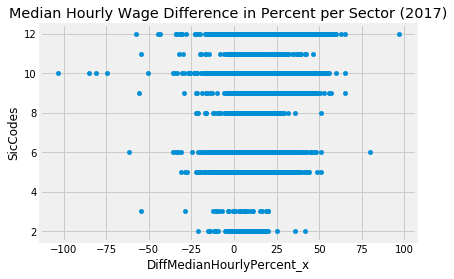

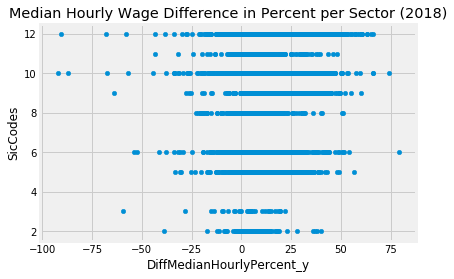

In [36]:
# Median hourly diff
clean_data.plot.scatter(x = 'DiffMedianHourlyPercent_x', y = 'SicCodes')
plt.title('Median Hourly Wage Difference in Percent per Sector (2017)')

clean_data.plot.scatter(x = 'DiffMedianHourlyPercent_y', y = 'SicCodes')
plt.title('Median Hourly Wage Difference in Percent per Sector (2018)')
# !! How do I add title, and change axis labels

Text(0.5,1,'Median Bonus Difference in Percent per Sector (2018)')

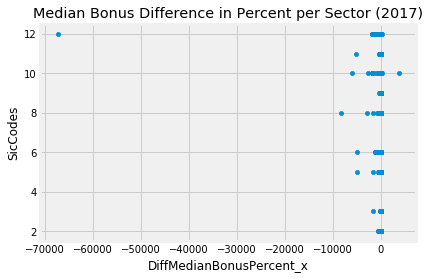

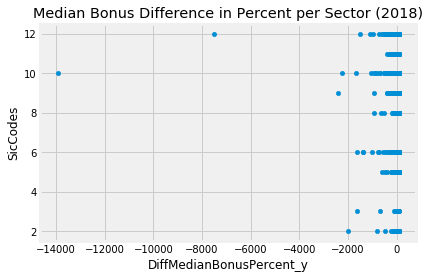

In [37]:
# Mean + median bonus diff
clean_data.plot.scatter(x = 'DiffMedianBonusPercent_x', y = 'SicCodes')
plt.title('Median Bonus Difference in Percent per Sector (2017)')

clean_data.plot.scatter(x = 'DiffMedianBonusPercent_y', y = 'SicCodes')
plt.title('Median Bonus Difference in Percent per Sector (2018)')

Text(0.5,1,'Median hourly GPG improvement from 2017 to 2018, in percent')

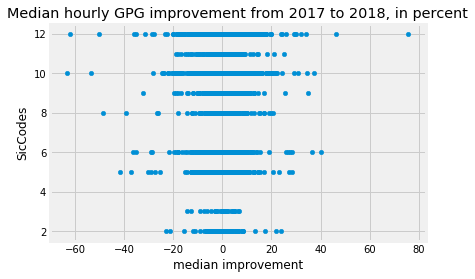

In [38]:
# Mean + median bonus diff
clean_data.plot.scatter(x = 'median improvement', y = 'SicCodes')
plt.title('Median hourly GPG improvement from 2017 to 2018, in percent')

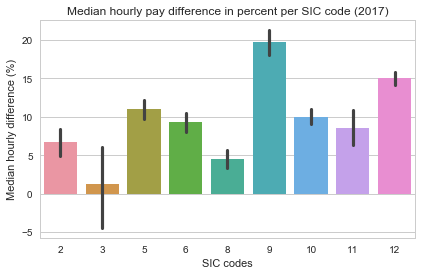

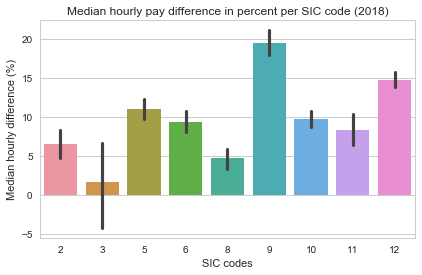

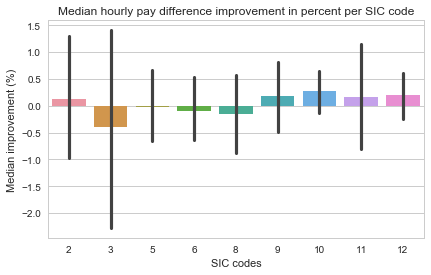

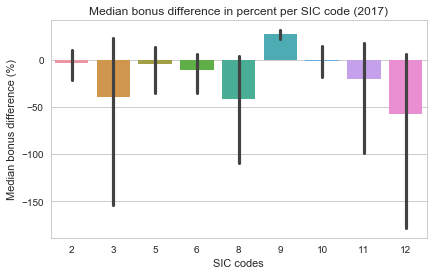

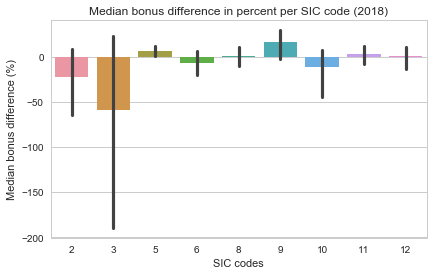

In [226]:
# median hourly difference per sector - 2017
import seaborn as sns
sns.set(style="whitegrid")
ax = sns.barplot(x="SicCodes", y="DiffMedianHourlyPercent_x", data=clean_data)
ax.set(xlabel='SIC codes', ylabel='Median hourly difference (%)')
plt.title("Median hourly pay difference in percent per SIC code (2017)")
plt.show(ax)

# median hourly difference per sector - 2018
sns.set(style="whitegrid")
ax = sns.barplot(x="SicCodes", y="DiffMedianHourlyPercent_y", data=clean_data)
ax.set(xlabel='SIC codes', ylabel='Median hourly difference (%)')
plt.title("Median hourly pay difference in percent per SIC code (2018)")
plt.show(ax)

# median improvement
sns.set(style="whitegrid")
ax = sns.barplot(x="SicCodes", y="median improvement", data=clean_data)
ax.set(xlabel='SIC codes', ylabel='Median improvement (%)')
plt.title("Median hourly pay difference improvement in percent per SIC code")
plt.show(ax)

# median hourly bonus difference per sector - 2017
sns.set(style="whitegrid")
ax = sns.barplot(x="SicCodes", y="DiffMedianBonusPercent_x", data=clean_data)
ax.set(xlabel='SIC codes', ylabel='Median bonus difference (%)')
plt.title("Median bonus difference in percent per SIC code (2017)")
plt.show(ax)

# median hourly bonus difference per sector - 2018
sns.set(style="whitegrid")
ax = sns.barplot(x="SicCodes", y="DiffMedianBonusPercent_y", data=clean_data)
ax.set(xlabel='SIC codes', ylabel='Median bonus difference (%)')
plt.title("Median bonus difference in percent per SIC code (2018)")
plt.show(ax)

Firstly, scatterplots were created to explore potential extreme outliers. For median hourly GPG and median improvement all cases fall within +-100%. 

However, for median bonus difference there are extreme outliers (below -2000% i.e. favouring women). Theoretically, these outliers could be a true representation of reality, as the GPG is calculated as the difference between the median man and the median woman expressed as a percentage of the median man’s income. This means that if the median man receives £25,000 and the median woman receives £20,000, then the difference of £5,000 is 20% of the man’s income. Consequently, the median percentage figure can never exceed 100%. However, if the median woman receives more than the median man the GPG can exceed -100%. Therefore, as the outliers for bonus difference favour women (i.e. exceeds 100% in the negative direction) it is possible that this is true. This could either be because very few women or very few men receive bonus’ in these companies – thereby skewing the median bonus figures – or simply that women earn significantly bigger bonusses than men. Or it could be that the company is reporting their data incorrectly. As previously explained, these ‘errors’ are kept within the dataset as the aim of this paper is to classify sector based on their reported GPG – not necessarily their actual GPG. 

The main attributes were also plotted as bar charts with confidence intervals (CI) – as this gives a ‘cleaner’ and more aesthetically pleasing overview of the data. The bar charts show a clear difference between some SIC codes in terms of median hourly GPG (2018 and 2017), with no overlapping CI (i.e. groups are significantly different). Although, most of the CI’s look decent, SIC code 3 (Construction) still has an extremely big CI indicating large spread of the data within that group (thereby making the group less distinguishable). 

The issue with CI’s is especially noticeable when looking at the plot for median improvement per SIC code. All CI’s overlap and are very large. This indicates that the improvement varies hugely within each group, and that there is no significant difference of improvement between groups. Furthermore, it shows that sector 3 (construction) increased their median GPG.

Looking at the bar chart for median bonus difference, the difference especially favours women in 2017, whereas sector 2 and 3 (mining, construction) still are very skewed towards women in 2018. However, the previous scatterplots highlighted that the bonus difference data is influenced by extreme outliers and thus must be interpreted with caution. 

In [40]:
print('The median bonus difference in 2017 was:', clean_data['DiffMedianBonusPercent_x'].median())
print('The median bonus difference in 2018 was:', clean_data['DiffMedianBonusPercent_y'].median())

The median bonus difference in 2017 was: 12.9
The median bonus difference in 2018 was: 13.0


The way the GPG is calculated makes it difficult to compare men and women as there is a natural ceiling effect for companies favouring men (at 100%), whereas there is no floor for companies favouring women. Therefore, you cannot compare both sides of zero on the plot ‘like-for-like’. Furthermore, when looking at the overall median bonus difference for both years it clearly favours men (i.e. 13% both years). It should be noted that this median for each year was calculated as a median of medians, which is obviously not ideal, but without individual salary/bonus information it is impossible to get a true average.

Another aspect of the bonus payment GPG is the proportion of each gender group that actually receives a bonus. As the pie charts below show, slightly more men than women receive bonusses (2017 and 2018).

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1a20363668>,
      dtype=object)

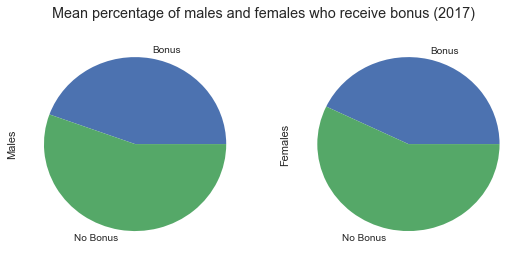

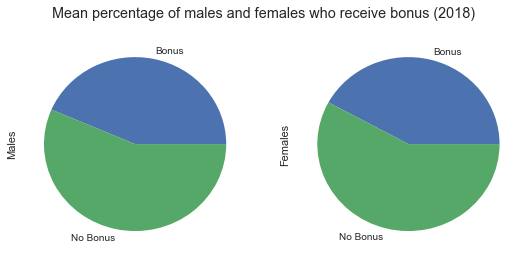

In [41]:
# Male bonus percent & Female bonus percent - how big proportion of each gender receives a bonus 
MaleBonus17 = clean_data['MaleBonusPercent_y'].mean()
NoMaleBonus17 = 100 - MaleBonus17
FemaleBonus17 = clean_data['FemaleBonusPercent_y'].mean()
NoFemaleBonus17 = 100 - FemaleBonus17

# --- dataset 2: 3 columns and rownames
df = pd.DataFrame({'Males':[float(MaleBonus17), float(NoMaleBonus17)], 'Females':[float(FemaleBonus17), float(NoFemaleBonus17)]}, index=['Bonus', 'No Bonus'] )
 
# make the multiple plot
df.plot(kind='pie', subplots=True, figsize=(8,4), use_index=False, legend=False, title='Mean percentage of males and females who receive bonus (2017)')

# 2018
MaleBonus = clean_data['MaleBonusPercent_x'].mean()
NoMaleBonus = 100 - MaleBonus
FemaleBonus = clean_data['FemaleBonusPercent_x'].mean()
NoFemaleBonus = 100 - FemaleBonus

df = pd.DataFrame({'Males':[float(MaleBonus), float(NoMaleBonus)], 'Females':[float(FemaleBonus), float(NoFemaleBonus)]}, index=['Bonus', 'No Bonus'] )
 
df.plot(kind='pie', subplots=True, figsize=(8,4), use_index=False, legend=False, title='Mean percentage of males and females who receive bonus (2018)')

/Users/dagmar/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


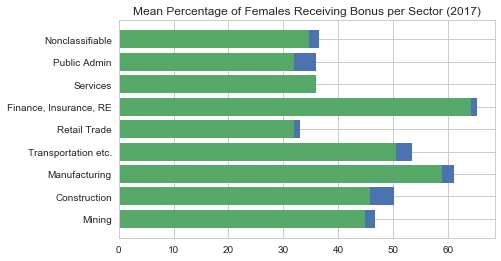

/Users/dagmar/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


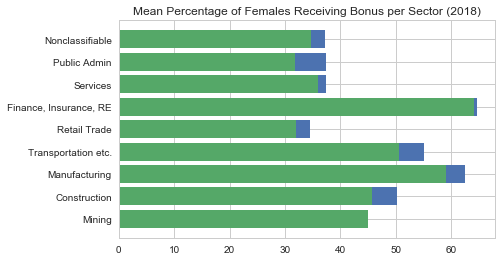

In [42]:
import numpy as np

# receiving bonus per SIC code
bonus_sic_male = clean_data['MaleBonusPercent_x'].groupby(clean_data['SicCodes']).mean()

# dataset
bonusP = bonus_sic_male
bars = ('Mining', 'Construction', 'Manufacturing', 'Transportation etc.', 'Retail Trade', 'Finance, Insurance, RE', 'Services', 'Public Admin', 'Nonclassifiable')
y_pos = np.arange(len(bars))
 
# horizontal bars
plt.barh(y_pos, bonusP)
 
# SIC labels + Title
plt.yticks(y_pos, bars)
plt.title('Mean Percentage of Males Receiving Bonus per Sector (2017)')

bonus_sic_female = clean_data['FemaleBonusPercent_x'].groupby(clean_data['SicCodes']).mean()

# dataset
bonusP1 = bonus_sic_female
bars = ('Mining', 'Construction', 'Manufacturing', 'Transportation etc.', 'Retail Trade', 'Finance, Insurance, RE', 'Services', 'Public Admin', 'Nonclassifiable')
y_pos = np.arange(len(bars))
 
# horizontal bars
plt.barh(y_pos, bonusP1)
 
# SIC labels + Title
plt.yticks(y_pos, bars)
plt.title('Mean Percentage of Females Receiving Bonus per Sector (2017)')

# Add plots to same plot
plt2017 = plt.subplot(111)
plt.show()

# 2018
bonus_sic_male18 = clean_data['MaleBonusPercent_y'].groupby(clean_data['SicCodes']).mean()
bonusP18 = bonus_sic_male18
bars18 = ('Mining', 'Construction', 'Manufacturing', 'Transportation etc.', 'Retail Trade', 'Finance, Insurance, RE', 'Services', 'Public Admin', 'Nonclassifiable')
y_pos18 = np.arange(len(bars18))
plt.barh(y_pos18, bonusP18)
plt.yticks(y_pos18, bars18)
plt.title('Mean Percentage of Males Receiving Bonus per Sector (2018)')
bonus_sic_female18 = clean_data['FemaleBonusPercent_y'].groupby(clean_data['SicCodes']).mean()
bonusP1_18 = bonus_sic_female
bars1_18 = ('Mining', 'Construction', 'Manufacturing', 'Transportation etc.', 'Retail Trade', 'Finance, Insurance, RE', 'Services', 'Public Admin', 'Nonclassifiable')
y_pos18 = np.arange(len(bars1_18))
plt.barh(y_pos18, bonusP1_18)
plt.yticks(y_pos18, bars18)
plt.title('Mean Percentage of Females Receiving Bonus per Sector (2018)')
plt2017 = plt.subplot(111)
plt.show()

When looking at the mean proportion of females/males receiving a bonus per sector, there is not much difference between men and women within each sector. However, unsurprisingly some sectors are more prone to give bonusses overall than other sectors. 

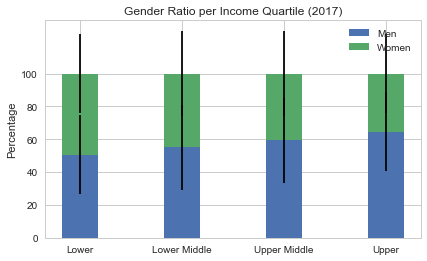

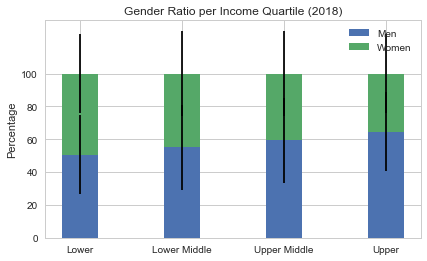

In [43]:
# Bar chart - showing men/women ratio per quartile
# 2017
# Lower quartile
LQM_mean = clean_data["MaleLowerQuartile_y"].mean()
LQM_Std = clean_data["MaleLowerQuartile_y"].std()
LQF_mean = clean_data["FemaleLowerQuartile_y"].mean()
LQF_Std = clean_data["FemaleLowerQuartile_y"].std()
# Lower middle quartile
LmQM_mean = clean_data["MaleLowerMiddleQuartile_y"].mean()
LmQM_Std = clean_data["MaleLowerMiddleQuartile_y"].std()
LmQF_mean = clean_data["FemaleLowerMiddleQuartile_y"].mean()
LmQF_Std = clean_data["FemaleLowerMiddleQuartile_y"].std()
# Upper middle quartile
UmQM_mean = clean_data["MaleUpperMiddleQuartile_y"].mean()
UmQM_Std = clean_data["MaleUpperMiddleQuartile_y"].std()
UmQF_mean = clean_data["FemaleUpperMiddleQuartile_y"].mean()
UmQF_Std = clean_data["FemaleUpperMiddleQuartile_y"].std()
# Top quartile
UQM_mean = clean_data["MaleTopQuartile_y"].mean()
UQM_Std = clean_data["MaleTopQuartile_y"].std()
UQF_mean = clean_data["FemaleTopQuartile_y"].mean()
UQF_Std = clean_data["FemaleTopQuartile_y"].std()

menQ = (LQM_mean, LmQM_mean, UmQM_mean, UQM_mean)
womenQ = (LQF_mean, LmQF_mean, UmQF_mean, UQF_mean)
male_Std = (LQM_Std, LmQM_Std, UmQM_Std, UQM_Std)
female_Std = (LQF_Std, LmQF_Std, UmQF_Std, UQF_Std)

ind = np.arange(4) # 4 groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, menQ, width, yerr=male_Std)
p2 = plt.bar(ind, womenQ, width, bottom=menQ, yerr=female_Std)

plt.ylabel('Percentage')
plt.title('Gender Ratio per Income Quartile (2017)')
plt.xticks(ind, ('Lower', 'Lower Middle', 'Upper Middle', 'Upper'))
plt.yticks(np.arange(0, 110, 20))
plt.legend((p1[0], p2[0]), ('Men', 'Women'))

plt.show()

# 2018
LQM_mean18 = clean_data["MaleLowerQuartile_y"].mean()
LQM_Std18 = clean_data["MaleLowerQuartile_y"].std()
LQF_mean18 = clean_data["FemaleLowerQuartile_y"].mean()
LQF_Std18 = clean_data["FemaleLowerQuartile_y"].std()
LmQM_mean18 = clean_data["MaleLowerMiddleQuartile_y"].mean()
LmQM_Std18 = clean_data["MaleLowerMiddleQuartile_y"].std()
LmQF_mean18 = clean_data["FemaleLowerMiddleQuartile_y"].mean()
LmQF_Std18 = clean_data["FemaleLowerMiddleQuartile_y"].std()
UmQM_mean18 = clean_data["MaleUpperMiddleQuartile_y"].mean()
UmQM_Std18 = clean_data["MaleUpperMiddleQuartile_y"].std()
UmQF_mean18 = clean_data["FemaleUpperMiddleQuartile_y"].mean()
UmQF_Std18 = clean_data["FemaleUpperMiddleQuartile_y"].std()
UQM_mean18 = clean_data["MaleTopQuartile_y"].mean()
UQM_Std18 = clean_data["MaleTopQuartile_y"].std()
UQF_mean18 = clean_data["FemaleTopQuartile_y"].mean()
UQF_Std18 = clean_data["FemaleTopQuartile_y"].std()
menQ18 = (LQM_mean18, LmQM_mean18, UmQM_mean18, UQM_mean18)
womenQ18 = (LQF_mean18, LmQF_mean18, UmQF_mean18, UQF_mean18)
male_Std18 = (LQM_Std18, LmQM_Std18, UmQM_Std18, UQM_Std18)
female_Std18 = (LQF_Std18, LmQF_Std18, UmQF_Std18, UQF_Std18)
ind18 = np.arange(4) # 4 groups
width18 = 0.35       # the width of the bars: can also be len(x) sequence
p1_1818 = plt.bar(ind18, menQ18, width18, yerr=male_Std18)
p2_18 = plt.bar(ind18, womenQ18, width18, bottom=menQ18, yerr=female_Std18)
plt.ylabel('Percentage')
plt.title('Gender Ratio per Income Quartile (2018)')
plt.xticks(ind18, ('Lower', 'Lower Middle', 'Upper Middle', 'Upper'))
plt.yticks(np.arange(0, 110, 20))
plt.legend((p1[0], p2[0]), ('Men', 'Women'))

plt.show()

Text(0.5,1,'Proportion of females per Income Quartile in each SIC code (2017)')

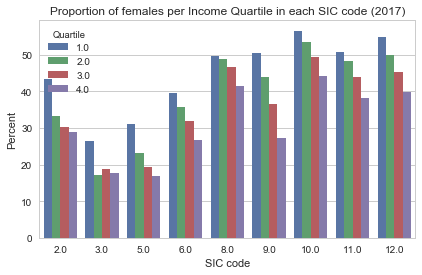

In [44]:
# Female distribution across quartiles - 2017
LQF_mean = pd.DataFrame({'Percent':clean_data["FemaleLowerQuartile_y"].groupby(clean_data['SicCodes']).mean(), 'Sic1':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q1':[1, 1, 1, 1, 1, 1, 1, 1, 1]})
LmQF_mean = pd.DataFrame({'Percent':clean_data["FemaleLowerMiddleQuartile_y"].groupby(clean_data['SicCodes']).mean(), 'Sic2':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q2':[2, 2, 2, 2, 2, 2, 2, 2, 2]})
UmQF_mean = pd.DataFrame({'Percent':clean_data["FemaleUpperMiddleQuartile_y"].groupby(clean_data['SicCodes']).mean(), 'Sic3':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q3':[3, 3, 3, 3, 3, 3, 3, 3, 3]})
UQF_mean = pd.DataFrame({'Percent':clean_data["FemaleTopQuartile_y"].groupby(clean_data['SicCodes']).mean(), 'Sic4':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q4':[4, 4, 4, 4, 4, 4, 4, 4, 4]})

# make 4 DF with each quartile number + sic code
# merge df's with outer join
M1 = pd.merge(LQF_mean, LmQF_mean, on='Percent', how='outer')
M2 = pd.merge(M1, UmQF_mean, on='Percent', how='outer')
M3 = pd.merge(M2, UQF_mean, on='Percent', how='outer')
# test['Sic_x'] = pd.to_numeric(test['Sic_x'])
# test['Sic_y'] = pd.to_numeric(test['Sic_y'])

# merge Sic code, and quartile columns to one each
SIC = []
for i,j,k,l in zip(M3['Sic1'],M3['Sic2'],M3['Sic3'],M3['Sic4']): 
    if (i>1):
        SIC.append(i)
    if (j>1):
        SIC.append(j)
    if (k>1):
        SIC.append(k)
    if (l>1):
        SIC.append(l)
M3['SIC code'] = SIC

Quartile = []
for a,b,c,d in zip(M3['Q1'],M3['Q2'],M3['Q3'],M3['Q4']):
    if (a==1):
        Quartile.append(a)
    if (b==2):
        Quartile.append(b)
    if (c==3):
        Quartile.append(c)
    if (d==4):
        Quartile.append(d)
M3['Quartile'] = Quartile

# Visualise df
import seaborn as sns
sns.set(style="whitegrid")
ax = sns.barplot(x="SIC code", y="Percent", hue="Quartile", data=M3)
plt.title('Proportion of females per Income Quartile in each SIC code (2017)')

Text(0.5,1,'Proportion of females per Income Quartile in each SIC code (2018)')

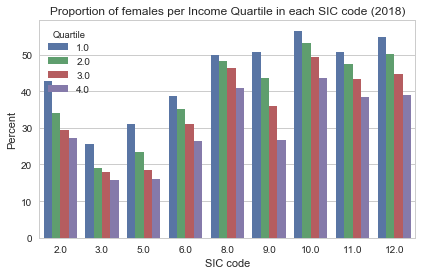

In [45]:
# Female distribution across quartiles - 2018
LQF_mean18 = pd.DataFrame({'Percent':clean_data["FemaleLowerQuartile_x"].groupby(clean_data['SicCodes']).mean(), 'Sic1':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q1':[1, 1, 1, 1, 1, 1, 1, 1, 1]})
LmQF_mean18 = pd.DataFrame({'Percent':clean_data["FemaleLowerMiddleQuartile_x"].groupby(clean_data['SicCodes']).mean(), 'Sic2':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q2':[2, 2, 2, 2, 2, 2, 2, 2, 2]})
UmQF_mean18 = pd.DataFrame({'Percent':clean_data["FemaleUpperMiddleQuartile_x"].groupby(clean_data['SicCodes']).mean(), 'Sic3':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q3':[3, 3, 3, 3, 3, 3, 3, 3, 3]})
UQF_mean18 = pd.DataFrame({'Percent':clean_data["FemaleTopQuartile_x"].groupby(clean_data['SicCodes']).mean(), 'Sic4':clean_data['SicCodes'].groupby(clean_data['SicCodes']).mean(), 'Q4':[4, 4, 4, 4, 4, 4, 4, 4, 4]})

# make 4 DF with each quartile number + sic code
# merge df's with outer join
M1_18 = pd.merge(LQF_mean18, LmQF_mean18, on='Percent', how='outer')
M2_18 = pd.merge(M1_18, UmQF_mean18, on='Percent', how='outer')
M3_18 = pd.merge(M2_18, UQF_mean18, on='Percent', how='outer')
# test['Sic_x'] = pd.to_numeric(test['Sic_x'])
# test['Sic_y'] = pd.to_numeric(test['Sic_y'])

# merge Sic code, and quartile columns to one each
SIC18 = []
for i,j,k,l in zip(M3_18['Sic1'],M3_18['Sic2'],M3_18['Sic3'],M3_18['Sic4']): 
    if (i>1):
        SIC18.append(i)
    if (j>1):
        SIC18.append(j)
    if (k>1):
        SIC18.append(k)
    if (l>1):
        SIC18.append(l)
M3_18['SIC code'] = SIC18

Quartile18 = []
for a,b,c,d in zip(M3_18['Q1'],M3_18['Q2'],M3_18['Q3'],M3_18['Q4']):
    if (a==1):
        Quartile18.append(a)
    if (b==2):
        Quartile18.append(b)
    if (c==3):
        Quartile18.append(c)
    if (d==4):
        Quartile18.append(d)
M3_18['Quartile'] = Quartile18

# Visualise df
import seaborn as sns
sns.set(style="whitegrid")
ax = sns.barplot(x="SIC code", y="Percent", hue="Quartile", data=M3_18)
plt.title('Proportion of females per Income Quartile in each SIC code (2018)')

Exploring the spread of male and female earners across an organisation/sector shows where women’s progress might be stalling – and where action can be taken to support their career development. The above plots show how the ratio changes to include more men, the higher up you go in the ‘pay brackets’/quartiles – both overall and within each sector. However, it is worth noting that the confidence intervals are all very large. Indicating that the individual ratios vary a lot. 

Classification models try to assign each company to a group based on the given attributes. Thus, it is relevant to assess how much each attribute correlates with one another. Therefore, a correlogram is created that visually displays the relationship between each pair of numeric variables in a dataset through a scatterplot. The diagonal axis (top left, to bottom right) displays histograms of the distribution of each variable.

In [46]:
# create df of attributes
attributes = clean_data.drop(columns=['SicCodes', 'CompanyNumber', 'Unnamed: 0'])                                        

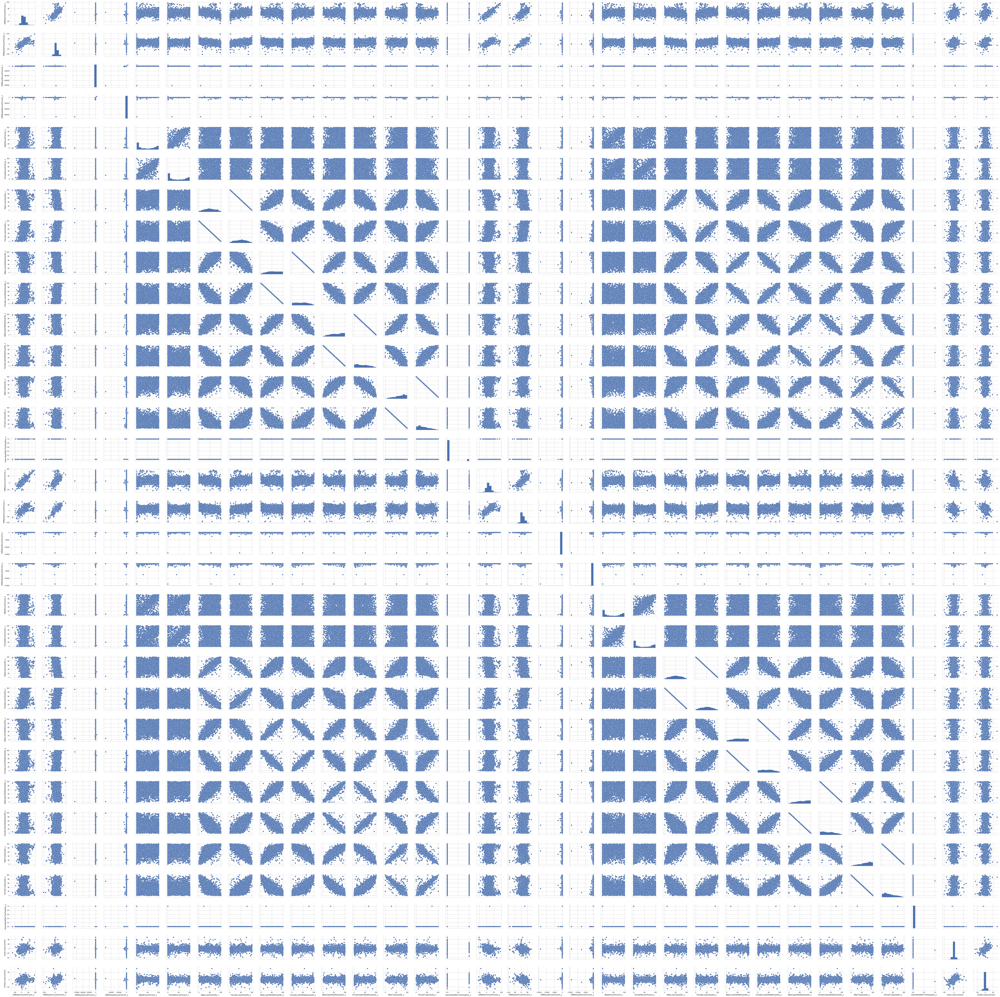

In [47]:
# correlogram
correlelogram = pd.DataFrame(attributes)
sns.pairplot(correlelogram, diag_kind="hist")

Looking at the diagonal axis in the correlogram, none of the attributes appear to be normally distributes (i.e. they are either pos/neg skewed, mesokurtic, or leptokurtic). However, as the sample size is large (N=4,034) this is not a concern for the future analyses (Field, 2009). The scatterplots indicate some high correlations among some attributes. This interdependency is further explored by calculating a correlation matrix. This method calculates the Pearson’s R statistic for each pair of attributes. Ideally, none of the attributes should correlate above .80 (Field, 2009).

In [49]:
# multicollinearity between attributes
attributes.corr()

,DiffMeanHourlyPercent_x,DiffMedianHourlyPercent_x,DiffMeanBonusPercent_x,DiffMedianBonusPercent_x,MaleBonusPercent_x,FemaleBonusPercent_x,MaleLowerQuartile_x,FemaleLowerQuartile_x,MaleLowerMiddleQuartile_x,FemaleLowerMiddleQuartile_x,...,FemaleLowerQuartile_y,MaleLowerMiddleQuartile_y,FemaleLowerMiddleQuartile_y,MaleUpperMiddleQuartile_y,FemaleUpperMiddleQuartile_y,MaleTopQuartile_y,FemaleTopQuartile_y,SubmittedAfterTheDeadline_y,mean improvement,median improvement
DiffMeanHourlyPercent_x,1.00,0.74,0.01,0.01,0.18,0.16,-0.29,0.29,-0.16,0.16,...,0.26,-0.15,0.15,-0.02,0.02,0.15,-0.15,-0.00,0.24,0.13
DiffMedianHourlyPercent_x,0.74,1.00,0.01,0.02,0.13,0.12,-0.27,0.27,-0.10,0.10,...,0.24,-0.09,0.09,0.09,-0.09,0.18,-0.18,0.00,0.11,0.23
DiffMeanBonusPercent_x,0.01,0.01,1.00,0.98,0.03,0.02,0.03,-0.03,0.03,-0.03,...,-0.03,0.03,-0.03,0.04,-0.04,0.03,-0.03,-0.00,-0.01,-0.01
DiffMedianBonusPercent_x,0.01,0.02,0.98,1.00,0.03,0.02,0.01,-0.01,0.02,-0.02,...,-0.01,0.02,-0.02,0.03,-0.03,0.02,-0.02,0.00,-0.02,-0.01
MaleBonusPercent_x,0.18,0.13,0.03,0.03,1.00,0.95,0.27,-0.27,0.31,-0.31,...,-0.28,0.32,-0.32,0.35,-0.35,0.40,-0.40,-0.02,-0.01,-0.01
FemaleBonusPercent_x,0.16,0.12,0.02,0.02,0.95,1.00,0.24,-0.24,0.28,-0.28,...,-0.24,0.28,-0.28,0.31,-0.31,0.35,-0.35,-0.02,0.00,0.00
MaleLowerQuartile_x,-0.29,-0.27,0.03,0.01,0.27,0.24,1.00,-1.00,0.88,-0.88,...,-0.95,0.88,-0.88,0.83,-0.83,0.77,-0.77,-0.02,-0.09,-0.07
FemaleLowerQuartile_x,0.29,0.27,-0.03,-0.01,-0.27,-0.24,-1.00,1.00,-0.88,0.88,...,0.95,-0.88,0.88,-0.83,0.83,-0.77,0.77,0.02,0.09,0.07
MaleLowerMiddleQuartile_x,-0.16,-0.10,0.03,0.02,0.31,0.28,0.88,-0.88,1.00,-1.00,...,-0.88,0.96,-0.96,0.92,-0.92,0.85,-0.85,-0.02,-0.06,-0.06
FemaleLowerMiddleQuartile_x,0.16,0.10,-0.03,-0.02,-0.31,-0.28,-0.88,0.88,-1.00,1.00,...,0.88,-0.96,0.96,-0.92,0.92,-0.85,0.85,0.02,0.06,0.06


All of the quartile measures correlate above .80 with each other. However, this is unsurprising as they are inherently related. Additionally, the percentage of males receiving a bonus correlates above .80 with the percentage of females receiving a bonus. However, the remaining attributes do not correlate above .80 with each other (i.e. no multicollinearity) which is good for the classification models.

The attribute group size distribution is investigated which shows very uneven group sizes between sectors/SIC codes. This could impact the performance of the classification models as they have less training cases for some groups than for others. However, no further action is taken, as groups below 25 cases have already been removed from the dataset.

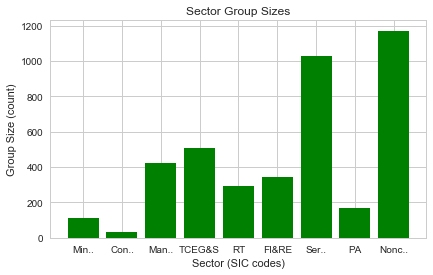

In [50]:
# SIC/sector group size
xs = ['Min..', 'Con..', 'Man..', 'TCEG&S', 'RT', 'FI&RE', 'Ser..', 'PA', 'Nonc..']
x_pos = [i for i, _ in enumerate(xs)]
Count = clean_data['Unnamed: 0'].groupby(clean_data['SicCodes']).agg('count') # set group count

plt.bar(x_pos, Count, color='green') # make plot
plt.xlabel('Sector (SIC codes)')
plt.ylabel('Group Size (count)')
plt.title('Sector Group Sizes')
plt.xticks(x_pos, xs)
plt.show()

Similarly, a brief investigation is conducted into the size distribution of company sizes in the sample. The below plots show that most companies have 250-499 employees. Approx. 1000 companies have 500-999 employees, and just under 1000 companies have between 1000-4999 employees. This trend is the same for both the companies reporting in 2017 and 2018. This information is important as the data in our sample is averages based on these companies. 

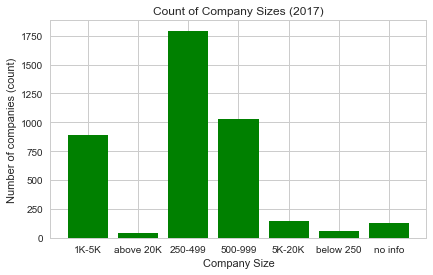

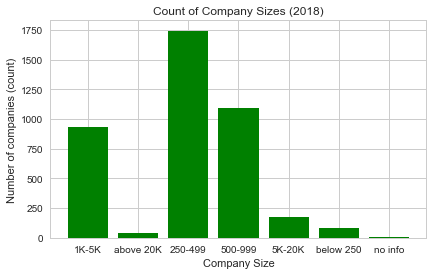

In [51]:
# Company size
groupsizes = ['1K-5K', 'above 20K', '250-499', '500-999', '5K-20K', 'below 250', 'no info']
ind = [i for i, _ in enumerate(groupsizes)]
Count17 = clean_data['Unnamed: 0'].groupby(clean_data['EmployerSize_x']).agg('count') # set group count

plt.bar(ind, Count17, color='green') # make plot
plt.xlabel('Company Size')
plt.ylabel('Number of companies (count)')
plt.title('Count of Company Sizes (2017)')
plt.xticks(ind, groupsizes)
plt.show()

# 2018
groupsizes = ['1K-5K', 'above 20K', '250-499', '500-999', '5K-20K', 'below 250', 'no info']
ind = [i for i, _ in enumerate(groupsizes)]
Count18 = clean_data['Unnamed: 0'].groupby(clean_data['EmployerSize_y']).agg('count')

plt.bar(ind, Count18, color='green') # make plot
plt.xlabel('Company Size')
plt.ylabel('Number of companies (count)')
plt.title('Count of Company Sizes (2018)')
plt.xticks(ind, groupsizes)
plt.show()

## Modelling - Classification
As previously described, this paper will look at the reported GPG data from 2017 and 2018 and explore whether the GPG ‘pattern’ can classify which sector a company belongs to. Therefore, a series of classification models will now be tested to ascertain which performs the best and whether it can reliably classify the data. 

Firstly, the cleaned data file is read in again to make sure the classification modelling starts out with a ‘clean’ data set that has not been accidentally changed.

In [52]:
clean_data_path = '/Users/dagmar/Desktop/UCL/DSSS-0006/Final Assignment/Gender pay gap/PreprocessedOutput.csv'
Cdata = pd.read_csv(clean_data_path) 

To assess the relationship between the companies’ GPG-attributes and their sector (SIC) classification, two datasets are created – one containing the attributes/X (without the labels/y) and one containing the labels/y.

In [53]:
# make attribute data set
X = Cdata.drop(columns=['SicCodes', 'CompanyNumber', 'Unnamed: 0', 'EmployerSize_x', 'EmployerSize_y'])

# prediction/label dataset split. 
y = Cdata.SicCodes

In [54]:
print(y.shape)
print(X.shape)

(4075,)
(4075, 32)


#### Splitting the data
The data is split into a testing and a training set, to see how well the classifier performs against data it has not seen yet. This gives a good indication of how well the classifier will work in the future. Although, one must keep in mind that in this case the test and training data sets are drawn from the same sample. Consequently, future datasets may have different biases etc. and the classification may therefore not necessarily be generalisable.

To split the data randomly into test and training subsets the 'scikit' 'train_test_split’ method is used (Scikitlearn, 2019a). This provides the format necessary to be loaded directly into subsequent classifiers and ensures a random mixing of the data. By default, this method splits the data 75:25 which is what is used.
The data is split into two sections (a training and a testing set) because classification has two phases, a learning phase and an evaluation phase. In the learning phase, the classifier trains its model on a given dataset. Whereas in the evaluation phase, it tests the classifier performance. 

In [55]:
# Split the data
from sklearn.model_selection import train_test_split

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [57]:
# Check the lengths of the training and testing datasets
print(X_train.shape)
print(X_test.shape)

(3056, 32)
(1019, 32)


#### Testing which classifier is best
The following multiclass classification models will be tested and evaluated on their performance to assess which one is the best fit for our data: K-Nearest Neighbour, Random Forest, Decision Tree, Support Vector Machine, and Multinomial Naïve Bayes Classification. 
To establish a baseline, a standard classifier without feature selection is conducted which will be used to compare the accuracy of each of the other classifiers (i.e. whether they are able to predict above chance).

The ‘scikit’ ‘metrics’ library is a good toolkit for measurements relating to the predictive power of classifiers. Each classification model has a callable ‘score’ method. However, they return different metrics to allow the classifiers to specify which scoring metric is most appropriate for that particular model. Consequently, the ‘score’ function is not optimal for comparing performance across classifiers.

The ‘precision_recall_fscore_support’ metric recall-score from ‘scikit’ on the other hand returns the fraction of correctly classified samples (i.e. the ability of the classifier to find all the positive samples) (sklearn, 2019). Therefore, the performance accuracy of the classification models will be evaluated using the ‘precision_recall_fscore_support’ metric – this is a good multiclass classification metric which accounts for class imbalance.
The ‘precision’ score returns the ability of the classifier not to label as positive a sample that is negative (i.e. avoiding type 1 error). The F-score is the weighted harmonic mean of the precision and recall scores and ranges from 1 (best) to 0 (worst). The ‘average’ parameter is set to ‘weighted’ as it calculates the metric for each label, and find their average weighted by the number of true instances for each label.

Similar to the precision_recall_fscore, the ‘classification_report()’ metric method takes the correct labels and compares them against the classifier predictions and returns an overview of the abovementioned four metrics for each label. This allows us to identify the labels where the classifier performs well and where it performs poorly.

To visually explore the extent to which each label was correctly and incorrectly classified, a confusion matrix is generated (using the ‘.confusion_matrix()’ method taking in the correct and predicted results. This is plotted using the matplotlib matrix plotting function. The confusion matrix evaluates the classification accuracy by computing the matrix with each row corresponding to the true label. The diagonal elements represent the number of cases correctly classified (true positives). All off-diagonal elements are those mislabelled by the classifier. Consequently, the higher the diagonal values the better (scikit-learn, 2019a). 

Lastly, each classifier is timed to assess them on both speed and accuracy.

#### Dummy Classifier
The ‘scikit’ ‘DummyClassifier’ is used to establish a baseline. This model randomly guesses the distribution based on the distribution of the targets. The ‘stratified’ strategy is used in the dummy classifier as it generates predictions by respecting the training set’s class distribution.

In [58]:
# Dummy classifier - to use as baseline
from sklearn.dummy import DummyClassifier

# add timing script
import time
start_time = time.time()

Dummy = DummyClassifier(strategy='stratified', random_state=None, constant=None)
Dummy.fit(X_train, y_train, sample_weight=None)
y_pred = Dummy.predict(X_test)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 0.010081052780151367


In [59]:
y_pred.shape #length of testing set, I get one prediction per row

(1019,)

In [60]:
Dummy.score(X_test, y_test) # default score

0.17271835132482827

In [61]:
from sklearn.metrics import precision_recall_fscore_support

dum_acc = precision_recall_fscore_support(y_test, y_pred, average='weighted') # the y_pred relates to the dummy classifier
print('Precision:', dum_acc[0])
print('Recall:', dum_acc[1])
print('F-score:', dum_acc[2])
print('Support:', dum_acc[3])

Precision: 0.19534558327762672
Recall: 0.19332679097154074
F-score: 0.19420997097066164
Support: None


The dummy classifier tells us that by chance it is able to correctly classify 19% (recall score) of the cases (baseline).  

#### K-Nearest Neighbour Classification (kNN)
kNN is a simple classification method in which the tested points are classified according to their proximity (attribute distance) to points seen during training. kNN does not make any assumptions on the data distribution (i.e. it is non-parametric) (Scikitlearn, 2019b). 

The scikit ‘KNeighborsClassifier’ requires you to set a hyperparameter (‘n_neighbors’) specifying how many neighbouring points it should check. To decide on the optimal number for this hyperparameter various numbers, in groups of 10, are tested. Therefore, the training set is split into 2 training sets with a 75:25 split (using the 25% for validation). The training set is split many times to find the best number for the hyperparameter. Sklearn’s selection tool ‘GridSearchCV’ is used as a wrapper around the estimator (kNN) which splits and trains the data and returns the optimal hyperparameter for the dataset.  

In [166]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

parameters = {'n_neighbors': [10, 20, 30, 40, 50, 60, 61, 70, 80]}
knn = KNeighborsClassifier()
gscv = GridSearchCV(knn, parameters, cv=5) #cv=cross validation, how many times to split it. so e.g. split it 5 times and try all the parameters and see which is best
gscv.fit(X_train, y_train)
gscv.best_estimator_ #tells me the best estimator

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=10, p=2,
           weights='uniform')

Based on the above cross-validation, the kNN classifier is conducted checking the 10 nearest neighbouring points on the original training set. The execution time for this is 0.01 seconds. 

In [167]:
start_time = time.time()

knn = KNeighborsClassifier(n_neighbors=10)  # creates the kNN classifier, setting it to check the 50 neighbouring points
knn.fit(X_train, y_train)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 0.009437799453735352


In [168]:
knn.score(X_test, y_test) 

0.3277723258096173

In [169]:
knn_ypred = knn.predict(X_test)

In [170]:
knn_acc = precision_recall_fscore_support(y_test, knn_ypred, average='weighted')
# gives me 4 numbers: 1)precision, 2) recall, 3) f-score, 4) support (ignore)
# gives me for the entire classifier and not for each class
print('Precision:', knn_acc[0])
print('Recall:', knn_acc[1])
print('F-score:', knn_acc[2])
print('Support:', knn_acc[3])

Precision: 0.3363165891063008
Recall: 0.3277723258096173
F-score: 0.32358405774475124
Support: None


The kNN performs better than the dummy classifier on both precision, recall and F-score (0.18, 0.18, 0.18 vs. 0.31, 0.34, 0.32). However, the kNN classifier still does not predict the labels particularly well. The recall score shows that in future events given a load more data, this model will be able to predict the sector of a company with an expected accuracy of 34%. Similarly, the precision score reveals that the model’s ability to avoid type 1 errors is 31% which is not ideal. And lastly, the F-score is closer to 0 than to 1. 

In [171]:
from sklearn import metrics
print (metrics.classification_report(y_test, knn_ypred))

             precision    recall  f1-score   support

          2       0.12      0.08      0.09        26
          3       0.00      0.00      0.00         9
          5       0.29      0.33      0.31       105
          6       0.38      0.31      0.34       127
          8       0.26      0.26      0.26        73
          9       0.27      0.32      0.29        82
         10       0.34      0.42      0.38       257
         11       0.64      0.15      0.25        46
         12       0.35      0.34      0.34       294

avg / total       0.34      0.33      0.32      1019



The classification report reveals that the kNN classifier is incapable of accurately classifying sector 2, 3, and 11 (Mining, Construction, Public Administration). However, it has a fair recall score for label 10 and 12 (Services, Nonclassifiable) indicating an expected accuracy of 43% and 53% for those labels in future events.

To further investigate the performance of this model, the actual results are looked at to identify the records where predictions succeed and fail. This is done by generating a set of predictions for each record, using the ‘.predict()’ method. This generates a table showing the predicted labels for each case. 

In [172]:
knn_ypred = knn.predict(X_test)
pd.DataFrame(knn_ypred).head() # shows the predicted labels for each class

,0
0,12
1,12
2,6
3,10
4,10


In [176]:
knn_confusion_matrix = metrics.confusion_matrix(y_test, knn_ypred)

In [177]:
knn_confusion_matrix

array([[  2,   0,   5,   0,   4,   3,   4,   0,   8],
       [  2,   0,   2,   3,   0,   0,   2,   0,   0],
       [  1,   3,  35,  17,   4,   5,  19,   0,  21],
       [  2,   0,  14,  39,   2,   5,  30,   0,  35],
       [  3,   0,   3,   3,  19,   2,  24,   0,  19],
       [  1,   0,  10,   2,   2,  26,  25,   0,  16],
       [  2,   0,  14,  14,  15,  27, 107,   3,  75],
       [  1,   0,   5,   0,   3,   4,  13,   7,  13],
       [  3,   0,  32,  25,  23,  24,  87,   1,  99]])

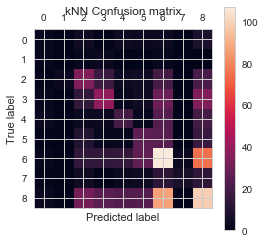

In [178]:
plt.matshow(knn_confusion_matrix)
plt.title('kNN Confusion matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

Similarly, the confusion matrix reveals that not all labels were accurately classified. Mostly, the kNN classifier was good at accurately classifying the third (Manufacturing), seventh (Services), and ninth (Nonclassifiable) label. Whereas, it often predicted Services to be Nonclassifiable and that the Nonclassifiable as Services. Consequently, although Services and Nonclassifiable were the ones most often accurately predicted, they were also the ones most often misclassified. An explanation could be the uneven cases in each class.

To sum up, overall the kNN classifier has poor performance. The classifier is okay at classifying Manufacturing, Services, and Nonclassifiable. Yet future samples may contain more companies within the labels, which the classifier performs poorly on, and this classifier would not be able to identify them. However, the classifier had a quick execution speed.

#### Random Forest Classification
The Random Forest classifier fits a number of decision tree classifiers on sub-samples of the dataset. It aims to improve the predictive accuracy and control over-fitting through averaging. The scikit-learn implementation combines classifiers by averaging their probabilistic prediction, instead of letting each classifier vote for a single class.

In Random Forests, each tree in the ensemble is built from a sample drawn with a bootstrap sample from the training set. When splitting a node during the construction of a tree, the chosen split is no longer the best among all features, but the best among a random subset of the features. This randomness slightly increases bias. However, variance also decreases due to averaging which compensates for the bias increase.

This classifier requires specification of how many trees should be created in the ‘forest’ (‘n_estimators’). The more trees chosen, the longer the classification process will take to run. Generally, the larger the number specified in the parameter the better. However, results will stop getting significantly better beyond a critical number of trees (scikit-learn, 2019b). The optimal number of trees is chosen using ‘GridSearchCV’ cross-validation. The default is 10, which leads to fully grown unpruned trees that can potentially be very large on some datasets. However, memory consumption is not a main concern with the current dataset size. Thus, the cross validation will be tested in groups of 10 ranging from 10 to 100.

In [180]:
from sklearn.ensemble import RandomForestClassifier

parameters = {'n_estimators': [10, 20, 30, 40, 50, 60, 61, 70, 80, 90, 100]}
rf = RandomForestClassifier()
gscv = GridSearchCV(rf, parameters, cv=5) #cv=cross validation, how many times to split it. so e.g. split it 5 times and try all the parameters and see which is best
gscv.fit(X_train, y_train)
gscv.best_estimator_ #tells me the best estimator

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

Based on the cross-validation the optimal number of trees is 100. Specifying and fitting the model with this parameter input results in an execution time of 0.82 seconds. 

In [181]:
start_time = time.time()

rf = RandomForestClassifier(n_estimators=100)
rf = rf.fit(X_train, y_train)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 0.8145022392272949


In [182]:
print(rf.feature_importances_) # which features are most important in explaining the target variable

[0.03883196 0.04057126 0.03016287 0.03106265 0.03859365 0.03585196
 0.0304253  0.03212357 0.03089193 0.03079005 0.03239903 0.03346263
 0.03240489 0.03468801 0.00364269 0.0398351  0.04038678 0.03103048
 0.03031075 0.03718949 0.03585789 0.02987169 0.02871529 0.02940444
 0.03046071 0.03102111 0.03149704 0.0322521  0.03261741 0.
 0.03212452 0.03152275]


Looking at the importance of each feature in explaining the target variable, all features contribute with similar importance. The only feature not contributing any importance is whether a company submitted their GPG after the deadline or not.

In [183]:
rf_ypred = rf.predict(X_test)
# pd.DataFrame(rf_ypred).head() # tells me the predicted labels for each class

In [192]:
rf.score(X_test, y_test)  # 'accuracy' score R-square

0.3591756624141315

In [193]:
rf_acc = precision_recall_fscore_support(y_test, rf_ypred, average='weighted')
print('kNN Precision:', knn_acc[0], 'RF Precision:', rf_acc[0])
print('kNN Recall:', knn_acc[1], 'RF Recall:', rf_acc[1])
print('kNN F-score:', knn_acc[2], 'RF F-score:', rf_acc[2])
print('kNN Support:', knn_acc[3], 'RF Support:', rf_acc[3])

kNN Precision: 0.3363165891063008 RF Precision: 0.3668265274099619
kNN Recall: 0.3277723258096173 RF Recall: 0.3591756624141315
kNN F-score: 0.32358405774475124 RF F-score: 0.3439339903144748
kNN Support: None RF Support: None


/Users/dagmar/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


According to the precision, recall and F-score, the Random Forest classifier performs slightly better overall than the kNN classifier. Whereas the kNN recall score suggested that the model would predict labels with a future expected accuracy of 33%, the Random Forest improves this to 36%. Likewise, the classification report (below) shows improvement from the kNN model as now only the ‘construction’ sector label has values of 0. The same pattern applies as in kNN that the Random Forest model performs best at predicting Manufacturing, Services and Nonclassifiable. Similarly, the confusion matrix for Random Forest looks similar to that of kNN. However, the execution time is longer for Random Forest than kNN – albeit still quick.

In [195]:
print (metrics.classification_report(y_test, rf_ypred))

             precision    recall  f1-score   support

          2       0.12      0.04      0.06        26
          3       0.00      0.00      0.00         9
          5       0.32      0.31      0.32       105
          6       0.32      0.20      0.24       127
          8       0.38      0.25      0.30        73
          9       0.28      0.21      0.24        82
         10       0.36      0.54      0.44       257
         11       0.90      0.20      0.32        46
         12       0.37      0.42      0.39       294

avg / total       0.37      0.36      0.34      1019



/Users/dagmar/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


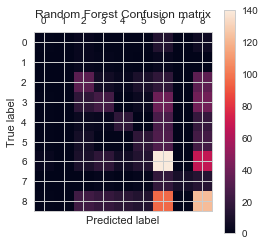

In [194]:
rf_confusion_matrix = metrics.confusion_matrix(y_test, rf_ypred)

plt.matshow(rf_confusion_matrix)
plt.title('Random Forest Confusion matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

#### Decision Tree Model
A Decision Tree classification model works in the form of a tree structure by breaking the dataset down into continuously smaller subsamples (while alongside an associated decision tree is incrementally developed).  The Decision Tree model in scikit-learn does not require any parameters and is therefore easy to implement. 

In [197]:
from sklearn.tree import DecisionTreeClassifier
start_time = time.time()

dtm = DecisionTreeClassifier()  # creates the decision tree classifier
dtm.fit(X_train, y_train)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 0.08478188514709473


In [198]:
dtm.score(X_test, y_test) 

0.26300294406280667

In [199]:
dtm_ypred = dtm.predict(X_test)
# pd.DataFrame(dtm_ypred).head() # tells me the predicted labels for each class    

In [201]:
dtm_acc = precision_recall_fscore_support(y_test, dtm_ypred, average='weighted')
print('RF Precision:', rf_acc[0])
print('DT Precision:', dtm_acc[0])
print('RF Recall:', rf_acc[1])
print('DT Recall:', dtm_acc[1])
print('RF F-score:', rf_acc[2])
print('DT F-score:', dtm_acc[2])
print('RF Support:', rf_acc[3])
print('DT Support:', dtm_acc[3])

RF Precision: 0.3668265274099619
DT Precision: 0.2624773767262354
RF Recall: 0.3591756624141315
DT Recall: 0.26300294406280667
RF F-score: 0.3439339903144748
DT F-score: 0.2624754984078854
RF Support: None
DT Support: None


In [202]:
print (metrics.classification_report(y_test, dtm_ypred))

             precision    recall  f1-score   support

          2       0.11      0.12      0.11        26
          3       0.00      0.00      0.00         9
          5       0.23      0.25      0.24       105
          6       0.24      0.22      0.23       127
          8       0.16      0.15      0.16        73
          9       0.13      0.15      0.14        82
         10       0.30      0.30      0.30       257
         11       0.26      0.22      0.24        46
         12       0.33      0.34      0.34       294

avg / total       0.26      0.26      0.26      1019



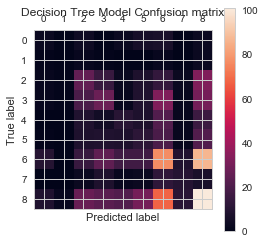

In [203]:
dtm_confusion_matrix = metrics.confusion_matrix(y_test, dtm_ypred)

plt.matshow(dtm_confusion_matrix)
plt.title('Decision Tree Model Confusion matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

Looking at the classification report and the confusion matrix, it is clear that the Decision Tree model performs worse than both kNN and Random Forest. 

#### Support Vector Machine (SVM)
A SVM is given labelled training data and outputs an optimal hyperplane which categorises new examples. SVM classification is effective in high dimensional spaces and uses a subset of training points in the decision function (support vectors) which makes it memory efficient. The default parameter values are ‘kernel=rbf’ and ‘gamma=1’ (scikit-learn, 2019c). 

Firstly, the default parameters are used. Subsequently, it is investigated whether changing the kernel to ‘linear’, and C (regularisation parameter) as respectively 10, 100, 1000 improves the model performance. A linear kernel will draw a straight line between sets of features (located based on their attributes). The ‘Gamma’ parameter defines how far the influence of a single training example reaches – for high gamma, only points near the hyperplane are considered, whereas for low gamma the far away points are also considered. 

The default parameter settings score marginally better (0.27) than the attempted customised settings (max achieved score of 0.26). Therefore, the default parameter settings are used. The execution time is 1.16 seconds (i.e. substantially slower than the previous classifiers).

In [204]:
from sklearn.svm import SVC
start_time = time.time()

svm = SVC()  
svm.fit(X_train, y_train)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 1.1141948699951172


In [205]:
svm.score(X_test, y_test) 

0.2914622178606477

In [206]:
svm_ypred = svm.predict(X_test)
# pd.DataFrame(svm_ypred).head() 

In [208]:
svm_acc = precision_recall_fscore_support(y_test, svm_ypred, average='weighted')
print('RF Precision:', rf_acc[0])
print('SVM Precision:', svm_acc[0])
print('RF Recall:', rf_acc[1])
print('SVM Recall:', svm_acc[1])
print('RF F-score:', rf_acc[2])
print('SVM F-score:', svm_acc[2])
print('RF Support:', rf_acc[3])
print('SVM Support:', svm_acc[3])

RF Precision: 0.3668265274099619
SVM Precision: 0.3458821262934417
RF Recall: 0.3591756624141315
SVM Recall: 0.2914622178606477
RF F-score: 0.3439339903144748
SVM F-score: 0.1371319198760107
RF Support: None
SVM Support: None


/Users/dagmar/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [209]:
print(metrics.classification_report(y_test, svm_ypred))

             precision    recall  f1-score   support

          2       0.00      0.00      0.00        26
          3       0.00      0.00      0.00         9
          5       0.00      0.00      0.00       105
          6       1.00      0.01      0.02       127
          8       0.00      0.00      0.00        73
          9       0.67      0.02      0.05        82
         10       0.33      0.00      0.01       257
         11       0.00      0.00      0.00        46
         12       0.29      1.00      0.45       294

avg / total       0.35      0.29      0.14      1019



/Users/dagmar/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


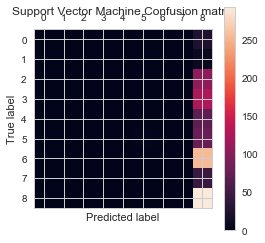

In [210]:
svm_confusion_matrix = metrics.confusion_matrix(y_test, svm_ypred)

plt.matshow(svm_confusion_matrix)
plt.title('Support Vector Machine Confusion matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

The SVM scores higher than the Random Forest Classifier on precision, however lower on recall and a lot lower on F-score. Looking at the confusion matrix the SVM model is only good at classifying ‘Unclassifiable’ labels (1 out of 9 labels). Furthermore, SVM is more time consuming.

#### Multinomial Naive Bayes Classification (MNB)
Naïve Bayes classification is based on Bayes Theorem (Gupta, 2017) which describes the probability of an event based on prior knowledge of conditions related to the event (P(h|D) = P(h|D)P(h)/P(D)*). This classifier assumes that the effect of a particular attribute in a label is independent of other attributes (i.e. class conditional interdependence). It is considered ‘naïve’ as this assumption simplifies computation. However, in reality (and the current dataset) it is nearly impossible that predictors are entirely independent.

Another disadvantage is the zero probability/frequency problem, meaning that if there is no training tuple of a particular label, it causes ‘zero posterior probability’ and the model is unable to make predictions. For the current dataset, it is likely this will happen as there is not an even split between labels (the smallest label is N=29). Therefore, when making a random split of the data, it is likely that a label will have 0 training tuples. 

*P(h): the probability of hypothesis h being true (regardless of the data). This is known as the prior probability of h. P(D): the probability of the data (regardless of the hypothesis). This is known as the prior probability. P(h|D): the probability of hypothesis h given the data D. This is known as posterior probability. P(D|h): the probability of data d given that the hypothesis h was true. This is known as posterior probability.

In [211]:
from sklearn.naive_bayes import GaussianNB

start_time = time.time()

nb = GaussianNB()
nb.fit(X_train, y_train)

end_time = time.time()
# print the time difference in seconds
print('Execution time:', end_time - start_time)

Execution time: 0.00935220718383789


In [212]:
nb_ypred = nb.predict(X_test)
# pd.DataFrame(nb_ypred).head() 

In [213]:
nb.score(X_test, y_test) 

0.2325809617271835

In [214]:
nb_acc = precision_recall_fscore_support(y_test, nb_ypred, average='weighted')
print('RF Precision:', rf_acc[0])
print('NB Precision:', nb_acc[0])
print('RF Recall:', rf_acc[1])
print('NB Recall:', nb_acc[1])
print('RF F-score:', rf_acc[2])
print('NB F-score:', nb_acc[2])
print('RF Support:', rf_acc[3])
print('NB Support:', nb_acc[3])

RF Precision: 0.3668265274099619
NB Precision: 0.19912774121193558
RF Recall: 0.3591756624141315
NB Recall: 0.2325809617271835
RF F-score: 0.3439339903144748
NB F-score: 0.1798443868282866
RF Support: None
NB Support: None


In [215]:
print (metrics.classification_report(y_test, nb_ypred))

             precision    recall  f1-score   support

          2       0.14      0.38      0.20        26
          3       0.08      0.44      0.14         9
          5       0.21      0.58      0.31       105
          6       0.14      0.01      0.01       127
          8       0.19      0.55      0.28        73
          9       0.20      0.46      0.28        82
         10       0.39      0.29      0.34       257
         11       0.57      0.17      0.27        46
         12       0.00      0.00      0.00       294

avg / total       0.20      0.23      0.18      1019



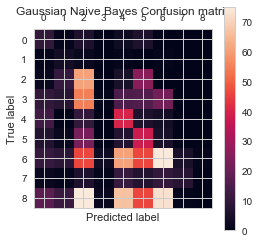

In [216]:
nb_confusion_matrix = metrics.confusion_matrix(y_test, nb_ypred)

plt.matshow(nb_confusion_matrix)
plt.title('Gaussian Naive Bayes Confusion matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

Comparing the overall precision, recall, and F-scores of the classifiers, MNB does not outperform Random Forest. However, when inspecting these scores for each label, and looking at the confusion matrix it seems that the MNB model is better at classifying a wider range of labels. Especially, this model is good at correctly classifying ‘Transportation, Communications, Electric, Gas and Sanitary service’ which none of the other models have excelled at. However, it also misclassifies a lot of labels.

#### Classification confidence
Although the Random Forest Classifier is able to accurately classify the most cases, the MNB classifier was able to correctly classify across a broader range of labels. Therefore, the performance of these two are further assessed by looking at the confidence with which they make their predictions (probability using ‘.predict_proba’). For each label the ‘.predict_proba’ function calculates the probability of the x-values belonging to the label. Based on this probability, a decision rule is implemented to predict the label with the highest probability. This is used to compare the classifiers’ confidence in both their equal label prediction and those they disagree on – to test whether one is more certain than another. 

In [217]:
# NB probability target predictions
nb_y_pred_proba = nb.predict_proba(X_test)

In [218]:
nb_y_pred_proba.shape # rows are rows of test dataset, colums are the classes
# in each cell is (for that row of the data) the probability for that class
pd.DataFrame(nb_y_pred_proba).head() # sum across rows is 1

,0,1,2,3,4,5,6,7,8
0,0.01,0.00,0.00,0.00,0.99,0.00,0.00,0.00,0.00
1,0.01,0.00,0.00,0.01,0.89,0.00,0.00,0.09,0.00
2,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.47,0.01,0.52,0.00,0.00,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,0.00,0.44,0.00,0.49,0.07,0.00


In [219]:
# rule - pick the max and take that column number (the arg-max: argument that maximises the function)
nb_y_pred_proba_rule = np.argmax(nb_y_pred_proba, axis=1) #axis=1 is columns
pd.DataFrame(nb_y_pred_proba_rule).head() # same number of rows, but 1 column, indicating the predicted label

,0
0,4
1,4
2,2
3,2
4,6


In [220]:
# RF probability target predictions
rf_y_pred_proba = rf.predict_proba(X_test)

In [221]:
rf_y_pred_proba.shape # rows are rows of test dataset, colums are the classes
# in each cell is (for that row of the data) the probability for that class
pd.DataFrame(rf_y_pred_proba).head() # sum across rows is 1

,0,1,2,3,4,5,6,7,8
0,0.03,0.00,0.05,0.04,0.24,0.11,0.30,0.03,0.20
1,0.06,0.00,0.02,0.05,0.22,0.02,0.40,0.08,0.15
2,0.03,0.02,0.09,0.29,0.01,0.08,0.03,0.00,0.45
3,0.06,0.00,0.19,0.05,0.03,0.08,0.22,0.03,0.34
4,0.00,0.00,0.00,0.15,0.05,0.04,0.44,0.03,0.29


In [222]:
# rule - pick the max and take that column number (the arg-max: argument that maximises the function)
rf_y_pred_proba_rule = np.argmax(rf_y_pred_proba, axis=1) #axis=1 is columns
pd.DataFrame(rf_y_pred_proba_rule).head() # same number of rows, but 1 column, indicating the predicted label

,0
0,6
1,6
2,8
3,8
4,6


In [223]:
# How many equal target predictions do they have?
rf_prediction = rf_y_pred_proba_rule
nb_prediction = nb_y_pred_proba_rule

agree = 0 # list counting how many cases they agree on the label prediction for
disagree = 0

for i,j in zip(rf_prediction, nb_prediction):
    if (i == j): # if the same label is predicted
        agree +=1 #count
    if (i!=j):
        disagree +=1
        
print('Number of agreed target predictions:', agree)
print('Number of disagreed target predictions:', disagree)

Number of agreed target predictions: 299
Number of disagreed target predictions: 720


In [224]:
# Calculating confidence difference for equal target predictions
rf_prediction = pd.DataFrame(rf_y_pred_proba_rule)
nb_prediction = pd.DataFrame(nb_y_pred_proba_rule)
rf_probability = pd.DataFrame(rf_y_pred_proba)
knn_probability = pd.DataFrame(knn_y_pred_proba)
# makes df with the probability of each label classification
rf_max = pd.DataFrame(rf_probability.max(axis=1))
# rf_max.head()

nb_max = pd.DataFrame(nb_probability.max(axis=1))
# nb_max.head()

# concatenate df's
confidence = pd.concat([rf_prediction, nb_prediction, rf_max, knn_max], axis=1)
confidence.columns = ['rf_label', 'nb_label', 'rf', 'nb']
confidence.head()

# Compare label prediction confidence

# calculate difference between probability(confidence)
confidence['diff'] = confidence['rf']-confidence['nb'] 
# diff score: positive diff means rf is better, negative=nb is better
confidence.head()

# only look at confidence difference for target equal target predictions

equal_pred_conf_diff = []
not_equal_pred_conf_diff = []
for a,b,c in zip(confidence['rf_label'], confidence['nb_label'], confidence['diff']):
    if (a == b): # if the same label is predicted
        equal_pred_conf_diff.append(c) #then add confidence difference to new list
    if (a != b): # if the same label is predicted
        not_equal_pred_conf_diff.append(c) #then add confidence difference to new list

DIFF = pd.DataFrame(equal_pred_conf_diff) # dataframe with confidence difference for equal target predictions
disagree_DIFF = pd.DataFrame(not_equal_pred_conf_diff)

totalDiff = DIFF.sum()/len(DIFF) # the total confidence difference = sum of all diff scores divided by the df length
print('total confidence difference for equal target predictions', float(totalDiff))

totalDiff_disagree = disagree_DIFF.sum()/len(disagree_DIFF)
print('total confidence difference for different target predictions', float(totalDiff_disagree))
# overall nb is slightly more confident in predictions than rf

total confidence difference for equal target predictions -0.031170568561872905
total confidence difference for different target predictions -0.06714561838624339


The two classifiers make 299 equal target predictions (i.e. disagree on 720). The overall confidence difference suggests that the MNB is slightly more confident in its predictions than the Random Forest Classifier. However, the difference is approaching zero and therefore not enough to favour MNB over Random Forest.

# Discussion
All of the above classifiers performed above chance (i.e. did better than the dummy classifier). The kNN classifier performed very similarly to the Random Forest and is good for non-parametric data. However, if a certain class is very frequent in the training set (e.g. the Nonclassifiable class in the current dataset), it can dominate the majority voting of the new example. With this in mind, the Random Forest and the MNB classifier performed the best out of the bunch. The Random Forest classifier made the most correct predictions, however, the MNB classifier was better at classifying across all labels. But the MNB also misclassified a lot of cases. The MNB was slightly more confident in its predictions compared to the Random Forest classifier – however this difference was approaching zero. Therefore, the Random Forest classifier overall performed better. Consequently, results suggest that a company’s sector can be predicted based on GPG attributes with a future expected accuracy of 34%.  

This shows that even the best classifier is not able to predict with a very convincing expected accuracy – and only accurately predicted certain labels. This suggests that GPG attributes do not differ enough across sectors to provide identifiable sector information. 

However, one must keep in mind the factors influencing the GPG attributes that are not controlled for in this study. Professional Service Employers (e.g. lawyers and management consultants) are not required to include equity partners in their calculations as they are not technically classified as employees (Fino, 2019). Yet, partners tend to be highly paid and be disproportionately male. Therefore, excluding this information is likely to skew the GPG output. This is an example of the importance of not just understanding the reported numbers, but also the ‘excluded’ numbers.

The overall median GPG for all sectors favoured men in both 2017 and 2018 (9.0%, 9.2%). Additionally, all sectors favoured men to varying degrees (ranging from 2% to 19%). The median hourly improvement from 2017 to 2018 was 0 suggesting no trend of improvement across companies. Looking at median improvement across sectors half improved and half increased their GPG. 

When assessing the GPG data it is important to keep in mind that closing the GPG takes time. Some efforts such as recruiting and training more women (e.g. in areas with small female talent pools) may temporarily increase the GPG. However, over time these women will gain the required skills and take senior roles. As the GPG data has only been collected since 2017, it is still too early to identify such patterns.

Finally, as demonstrated in this paper, there are issues with the validity of the GPG data. Examples include incoherent median and quartile reporting, and mathematically implausible reports like both the mean and median GPG being 0. From the dataset, it is clear that the government does not check the validity of the data companies submit, which raises questions about the effect of the regulation. The Equality and Human Rights Commission are responsible for enforcing GPG regulations, however this is obviously not done. Similarly, there is no public list of the companies expected to report their GPG each year which would be essential to catch the companies that fail to report. The difference between the companies reporting in 2017 (10,550) and 2018 (6,664) is 3,886. It seems implausible that there are 37% fewer companies below 250 employees in 2018 than in 2017. It is more plausible that companies neglect to report GPG data because of the lack the regulation being enforced (no company has yet been fined for failing to comply with legislation).

However, despite issues with enforcement and that the GPG does not capture all nuances of pay disparity, it is a step in the right direction of more transparency, accountability, action and improvement. The GPG data is crucial for developing actionable insights of where and how to improve within and across companies. However, one thing is identifying a GPG, another is understanding what drives it. This understanding is crucial for companies to develop meaningful action plans. 

This paper aimed at exploring sector-based trends in the GPG attributes to see whether sectors can be identified/classified based on these attributes. However, the findings did not reveal identifiable sector-based trends. Consequently, sector-based GPG interventions may not be the appropriate approach for tackling the GPG. Yet, before dismissing the concept of sector-based interventions, further studies are required to look into the drivers of the GPG on sector levels. It is possible that there might be different drivers depending on the sector which could help inform and drive future interventions. Similarly, there might be sector specific barriers. 

To conclude, although the Random Forest classifier performed the best, it is not possible to reliably classify which sector a company belongs to, based on their GPG attributes. This may be due to the validity of the GPG. Therefore, based on this paper, sector-based GPG interventions cannot be neither recommended nor ruled out. Future studies should investigate the GPG drivers and barriers on sector level to further understand whether sector-based interventions could be a useful tool to tackle the GPG in the future.

# References
Ajzen, I., 2002. Perceived behavioral control, self‐efficacy, locus of control, and the theory of planned behavior. J. Appl. Soc. Psychol. 32, 665–683.

Companies House, 2019. Nature of business: Standard Industrial Classification (SIC) codes [WWW Document]. URL https://resources.companieshouse.gov.uk/sic/ (accessed 4.3.19).

EasyJet, 2018. EasyJet’s Gender Pay and Our Amy Johnson Flying Initiative [WWW Document]. URL https://careers.easyjet.com (accessed 4.2.19).

Equal Pay Act, 1970. Equal Pay Act 1970 chapter 41 - arrangement of sections [WWW Document]. URL http://www.legislation.gov.uk/ukpga/1970/41/pdfs/ukpga_19700041_en.pdf (accessed 4.2.19).

Equal Pay Portal, 2018. Equal Pay Portal | Statistics. URL http://www.equalpayportal.co.uk/statistics/ (accessed 4.2.19).

Field, A., 2009. Discovering statistics using SPSS. Sage publications.

Fino, J., 2019. Government rejects adding partners in gender pay gap calculations [WWW Document]. URL https://economia.icaew.com/news/january-2019/government-rejects-adding-partners-in-gender-pay-gap-calculations (accessed 4.18.19).

Gordon, S., Ehrenberg-Shannon, B., Wisniewska, A., 2018. Financial services among worst for UK gender pay gap  | Financial Times [WWW Document]. URL https://www.ft.com/content/8ddac9d8-eca6-11e7-8713-513b1d7ca85a (accessed 4.12.19).

Government Equalities Office, 2017. Gender pay gap reporting: make your calculations [WWW Document]. GOV.UK. URL https://www.gov.uk/guidance/gender-pay-gap-reporting-make-your-calculations (accessed 4.2.19).

GOV.UK, 2019. Gender pay gap data [WWW Document]. URL https://gender-pay-gap.service.gov.uk/viewing/download (accessed 4.2.19).

GOV.UK, 2018a. gender pay gap explained [WWW Document]. URL https://gender-pay-gap.service.gov.uk/public/assets/pdf/gender-pay-gap-explained.pdf (accessed 3.29.19).

GOV.UK, 2018b. Gender pay gap data - yearly reporting [WWW Document]. URL https://gender-pay-gap.service.gov.uk/ (accessed 4.2.19).

GOV.UK, 2017. Goldman Sachs International gender pay gap data / 2017-18 [WWW Document]. URL https://gender-pay-gap.service.gov.uk/Employer/FAbZ7gxJ/2017 (accessed 3.29.19).

Gupta, D., 2017. Introduction to Conditional Probability and Bayes theorem for data science professionals. Anal. Vidhya. URL https://www.analyticsvidhya.com/blog/2017/03/conditional-probability-bayes-theorem/ (accessed 4.10.19).

Matplotlib, 2019. Matplotlib: Python plotting — Matplotlib 3.0.3 documentation [WWW Document]. URL https://matplotlib.org/ (accessed 4.16.19).

OECD Social Policy Division, 2018. OECD Family Database - Gender Pay Gaps for Full-time and Part-time Workers [WWW Document]. URL https://www.oecd.org/els/LMF_1_5_Gender_pay_gaps_for_full_time_workers.pdf (accessed 4.12.19).

ONS, 2007. UK SIC 2007 - Office for National Statistics [WWW Document]. URL https://www.ons.gov.uk/methodology/classificationsandstandards/ukstandardindustrialclassificationofeconomicactivities/uksic2007 (accessed 4.12.19).

Scikitlearn, 2019a. sklearn.model_selection.train_test_split — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html (accessed 4.17.19).

scikit-learn, 2019a. Confusion matrix — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py (accessed 4.10.19).

Scikitlearn, 2019b. sklearn.neighbors.KNeighborsClassifier — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html (accessed 4.18.19).

scikit-learn, 2019b. 1.11. Ensemble methods — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/modules/ensemble.html#forests-of-randomized-trees) (accessed 4.10.19).

scikit-learn, 2019c. 1.4. Support Vector Machines — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/modules/svm.html (accessed 4.10.19).

sklearn, 2019. sklearn.metrics.precision_recall_fscore_support — scikit-learn 0.20.3 documentation [WWW Document]. URL https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_recall_fscore_support.html (accessed 4.9.19).

Waskom, M., 2019. seaborn: statistical data visualization — seaborn 0.9.0 documentation [WWW Document]. URL https://seaborn.pydata.org/ (accessed 4.16.19).

Whaley, N., 2018. 3 long-term effects the gender pay gap has on women [WWW Document]. Inst. Womens Policy Res. URL https://iwpr.org/3-long-term-effects-gender-pay-gap-women/ (accessed 4.21.19).

# Library Versions
Pandas version 0.23.0

Matplotlib version 2.2.2

Numpy version 1.14.3

Seaborn version 0.8.1

Scipy version 1.1.0

Scikit-learn version 0.19.1